# Model Interpretability

## Author: 
- Yash Pankhania (pankhania.y@northeastern.edu)

Github Repository URL: https://github.com/Draconian10/Australia_Weather_Prediction

## Abstract
This notebook aimed to interpret various models for Australian weather prediction to predict rainfall tomorrow. We fitted a logistic model and interpreted the coefficients, a tree-based model and interpreted the nodes, and used Auto-ML to find the best model. To compare the models, we conducted SHAP analysis, which revealed that the logistic model provided straightforward insights, the tree-based model had a complex decision-making process, and the Auto-ML model had limited interpretability. Our study highlights the importance of interpretability in machine learning models to gain valuable insights into their decision-making process.


## What is Model Interpretability?
Model interpretability refers to the ability to explain how a machine learning model works and how it arrives at its predictions. It is the process of understanding and communicating the relationship between the input features and the output of a model.

In many real-world applications of machine learning, it is essential to understand why a model makes a particular decision or prediction. Model interpretability is important for several reasons, including:

- Trust and accountability 

    Understanding how a model makes predictions can increase trust in its results and help ensure accountability.

- Debugging

    When a model produces unexpected or incorrect results, interpretability can help identify the source of the problem and facilitate debugging.

- Regulatory compliance 

    Some industries, such as healthcare and finance, require interpretability to comply with regulations and standards.

- Feature selection 

    Interpretability can help identify the most important features or variables that are driving the model's predictions.

In [1]:
# Installing H2O Library
!pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.2-py2.py3-none-any.whl size=177693439 sha256=ef7abca81850a6f5b23abde72280dbca0dc64ea708d31bfef55f4b17bbff0c5d
  Stored in directory: /root/.cache/pip/wheels/b2/79/e3/842b81607eb31946ee24898cc9961b101e6486f988a5103967
Successfully built h2o


In [2]:
# Installing SHAP Library
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 22.5 MB/s eta 0:00:00


In [3]:
# Installing LIME library
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 14.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=c2abc1fe6e26dd993afc1bd836181df32cea9f35fbd670af24977bf603ec1c60
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import h2o # Library is required to use the H2O AutoML interface
from h2o.automl import H2OAutoML
import shap # Library required to perform SHAP Analysis in Python
import lime
from lime import lime_tabular
%matplotlib inline
warnings.filterwarnings("ignore")

In [5]:
# Reading data from the CSV file and inserting it into a DataFrame
train_df = pd.read_csv('https://raw.githubusercontent.com/Draconian10/Australia_Weather_Prediction/main/Data_Cleaning_Feature_Selection/Weather%20Training%20Data.csv')

In [6]:
# Displaying data in the DataFrame
train_df.head()

,row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Row0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Row1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Row2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Row3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Row4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


In [7]:
# Fetching number of rows and columns
train_df.shape

(99516, 23)

In [8]:
# Fetching data types of each individual columns
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99516 entries, 0 to 99515
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   row ID         99516 non-null  object 
 1   Location       99516 non-null  object 
 2   MinTemp        99073 non-null  float64
 3   MaxTemp        99286 non-null  float64
 4   Rainfall       98537 non-null  float64
 5   Evaporation    56985 non-null  float64
 6   Sunshine       52199 non-null  float64
 7   WindGustDir    92995 non-null  object 
 8   WindGustSpeed  93036 non-null  float64
 9   WindDir9am     92510 non-null  object 
 10  WindDir3pm     96868 non-null  object 
 11  WindSpeed9am   98581 non-null  float64
 12  WindSpeed3pm   97681 non-null  float64
 13  Humidity9am    98283 non-null  float64
 14  Humidity3pm    97010 non-null  float64
 15  Pressure9am    89768 non-null  float64
 16  Pressure3pm    89780 non-null  float64
 17  Cloud9am       61944 non-null  float64
 18  Cloud3

In [9]:
# Fetching unique values in each column
train_df.nunique()

row ID           99516
Location            49
MinTemp            386
MaxTemp            500
Rainfall           601
Evaporation        327
Sunshine           145
WindGustDir         16
WindGustSpeed       67
WindDir9am          16
WindDir3pm          16
WindSpeed9am        43
WindSpeed3pm        44
Humidity9am        101
Humidity3pm        101
Pressure9am        536
Pressure3pm        536
Cloud9am            10
Cloud3pm            10
Temp9am            432
Temp3pm            491
RainToday            2
RainTomorrow         2
dtype: int64

In [10]:
# Fetching a descriptive statistics summary of the DataFrame
train_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
count,99073.000000,99286.000000,98537.000000,56985.00000,52199.000000,93036.000000,98581.000000,97681.000000,98283.000000,97010.000000,89768.000000,89780.000000,61944.000000,59514.000000,98902.000000,97612.000000,99516.000000
mean,12.176266,23.218513,2.353024,5.46132,7.615090,39.976966,14.004849,18.650464,68.866376,51.433296,1017.684638,1015.286204,4.447985,4.519122,16.970041,21.681340,0.224677
std,6.390882,7.115072,8.487866,4.16249,3.783008,13.581524,8.902323,8.801827,19.074951,20.777616,7.110166,7.045189,2.886580,2.716618,6.488961,6.931681,0.417372
min,-8.500000,-4.100000,0.000000,0.00000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,978.200000,0.000000,0.000000,-7.000000,-5.100000,0.000000
25%,7.600000,17.900000,0.000000,2.60000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.500000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.80000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.700000,1015.300000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.40000,10.600000,48.000000,19.000000,24.000000,83.000000,65.000000,1022.400000,1020.000000,7.000000,7.000000,21.500000,26.400000,0.000000
max,33.900000,48.100000,371.000000,86.20000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,1.000000


In [11]:
# Dropping unwanted columns from the DataFrame
train_df.drop(columns='row ID', inplace=True)
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


In [12]:
# Searching for NULL values in the DataFrame
train_df.isnull().sum()

Location             0
MinTemp            443
MaxTemp            230
Rainfall           979
Evaporation      42531
Sunshine         47317
WindGustDir       6521
WindGustSpeed     6480
WindDir9am        7006
WindDir3pm        2648
WindSpeed9am       935
WindSpeed3pm      1835
Humidity9am       1233
Humidity3pm       2506
Pressure9am       9748
Pressure3pm       9736
Cloud9am         37572
Cloud3pm         40002
Temp9am            614
Temp3pm           1904
RainToday          979
RainTomorrow         0
dtype: int64

In [13]:
# Replacing the string value 'NA' with NaN in the DataFrame
train_df['RainToday'] = train_df['RainToday'].replace('NA', np.nan)

In [14]:
# Displaying data in the DataFrame
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


### Imputing categorical values with Mode

In [15]:
# Replacing Null Categorical values with the mode of that column
for i in train_df[['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']]:
    train_df[i].fillna(train_df[i].mode()[0], inplace=True)

In [16]:
# Searching for NULL values in the DataFrame
train_df.isnull().sum()

Location             0
MinTemp            443
MaxTemp            230
Rainfall           979
Evaporation      42531
Sunshine         47317
WindGustDir          0
WindGustSpeed     6480
WindDir9am           0
WindDir3pm           0
WindSpeed9am       935
WindSpeed3pm      1835
Humidity9am       1233
Humidity3pm       2506
Pressure9am       9748
Pressure3pm       9736
Cloud9am         37572
Cloud3pm         40002
Temp9am            614
Temp3pm           1904
RainToday            0
RainTomorrow         0
dtype: int64

In [17]:
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


### Imputating Numeric Variables with MICE Imputation

In [18]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer # Library is required to perform Multivariate Imputation by Chained Equations (MICE) Imputation
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [19]:
# Splitting the DataFrame into Numeric and Categorical DataFrames
categorical_col = train_df[['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']]
numeric_col = train_df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm','Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainTomorrow']]

In [20]:
# Displaying categorical data in the DataFrame
categorical_col.head()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,Albury,W,W,WNW,No
1,Albury,WNW,NNW,WSW,No
2,Albury,W,ENE,NW,No
3,Albury,WNW,W,W,No
4,Albury,W,SSE,W,No


In [21]:
# Displaying numeric data in the DataFrame
numeric_col.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0
2,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0
3,14.6,29.7,0.2,NaN,NaN,56.0,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,0
4,7.7,26.7,0.0,NaN,NaN,35.0,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,0


### MICE Imputation
MICE (Multivariate Imputation by Chained Equations) is a statistical imputation technique that handles missing data in a dataset. It works by creating multiple imputed datasets and then combining the results to get a final imputed dataset. 

The idea behind this technique is to use the information in other variables to predict the missing values in each variable.

Refer: https://scikit-learn.org/stable/modules/impute.html

In [22]:
# Using MICE to impute missing values
imputer = IterativeImputer(random_state=0, n_nearest_features=3)
imputed_numeric_col = pd.DataFrame(imputer.fit_transform(numeric_col), columns = numeric_col.columns)

In [23]:
# Searching for NULL values in the DataFrame
imputed_numeric_col.isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainTomorrow     0
dtype: int64

In [24]:
# Concatenating the encoded DataFrame with the main DataFrame
concat_train_df = pd.concat([imputed_numeric_col, categorical_col], axis=1)

# Generating a duplicate DataFrame to be used for AutoML implementation
automl_train_df = pd.concat([imputed_numeric_col, categorical_col], axis=1)

In [25]:
# Displaying data in the DataFrame
concat_train_df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,13.4,22.9,0.6,7.634850,7.951930,44.0,20.0,24.0,71.0,22.0,...,8.000000,6.416307,16.9,21.8,0.0,Albury,W,W,WNW,No
1,7.4,25.1,0.0,5.765819,10.303316,44.0,4.0,22.0,44.0,25.0,...,2.482751,3.121249,17.2,24.3,0.0,Albury,WNW,NNW,WSW,No
2,17.5,32.3,1.0,8.104519,5.979908,41.0,7.0,20.0,82.0,33.0,...,7.000000,8.000000,17.8,29.7,0.0,Albury,W,ENE,NW,No
3,14.6,29.7,0.2,8.220281,10.379909,56.0,19.0,24.0,55.0,23.0,...,2.403320,3.232408,20.6,28.9,0.0,Albury,WNW,W,W,No
4,7.7,26.7,0.0,6.363272,10.798302,35.0,6.0,17.0,48.0,19.0,...,2.101078,2.974320,16.3,25.5,0.0,Albury,W,SSE,W,No


## Data Visualization

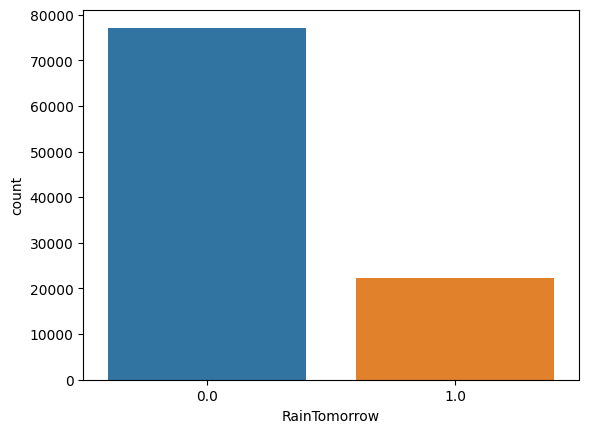

In [26]:
# Creating a count plot of the 'RainTomorrow' variable in the concatenated training data
sns.countplot(x = concat_train_df['RainTomorrow']);

This plot shows the total count of whether Rain occurs Tomorrow or not. 77157 records portray that there will be no rain whereas, 22359 records show that there will be rain tomorrow.

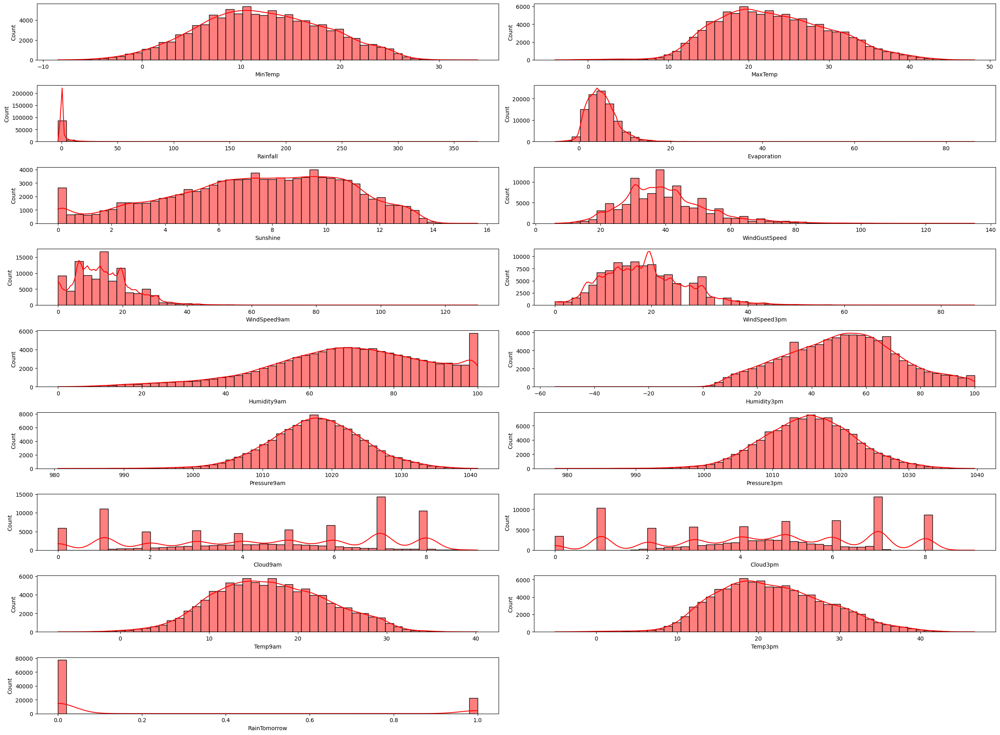

In [27]:
# Plotting a histogram to show the distribution of numeric variables
rows = 10
cols = 2
counter = 1
plt.rcParams['figure.figsize'] = [25, 20]
for i in numeric_col.columns:
    plt.subplot(rows, cols, counter)
    sns.histplot(concat_train_df[i], color = 'Red', kde = True, bins = 50)
    counter += 1
plt.tight_layout()
plt.show()

As observed, the distribution of numeric variables is as follows:
- MinTemp

  It is normally distributed

- MaxTemp

  It is normally distributed

- Rainfall

  It contains a lot of outliers which need to be removed to assess the distribution

- Evaporation

  It is right skewed

- Sunshine

  It looks pretty close to normal distribution

- WindGustSpeed

  It is right skewed

- WindSpeed9am

  It is right skewed

- WindSpeed3pm

  It is right skewed

- Humidity9am

  It is normally distributed

- Humidity3pm

  It is normally distributed

- Pressure9am

  It is normally distributed

- Pressure3pm

  It is normally distributed

- Cloud9am

  It is distributed with a very small range of values

- Cloud3pm

  It is distributed with a very small range of values

- Temp9am

  It is normally distributed

- Temp3pm

  It is normally distributed

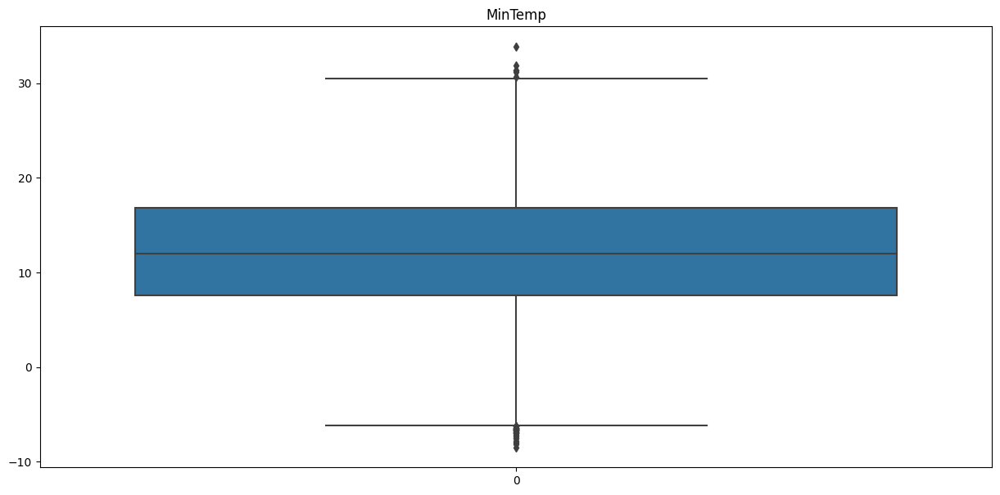

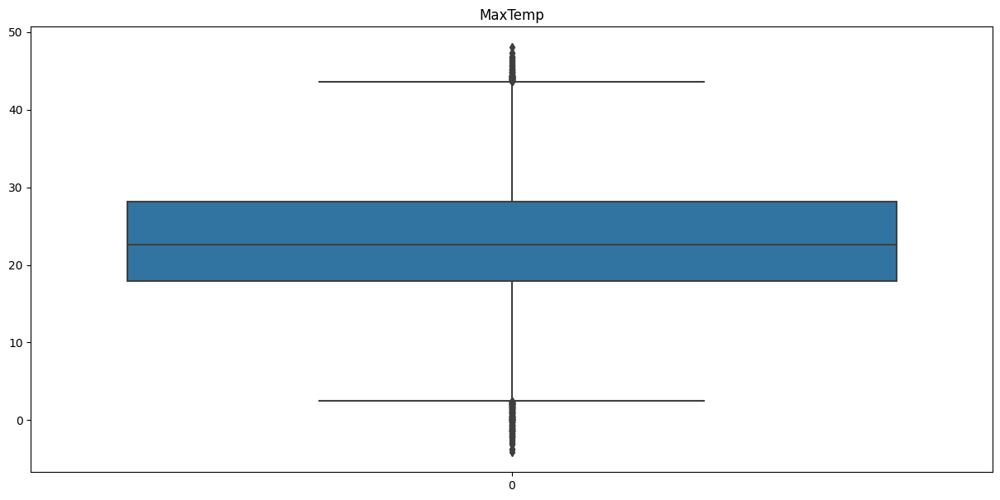

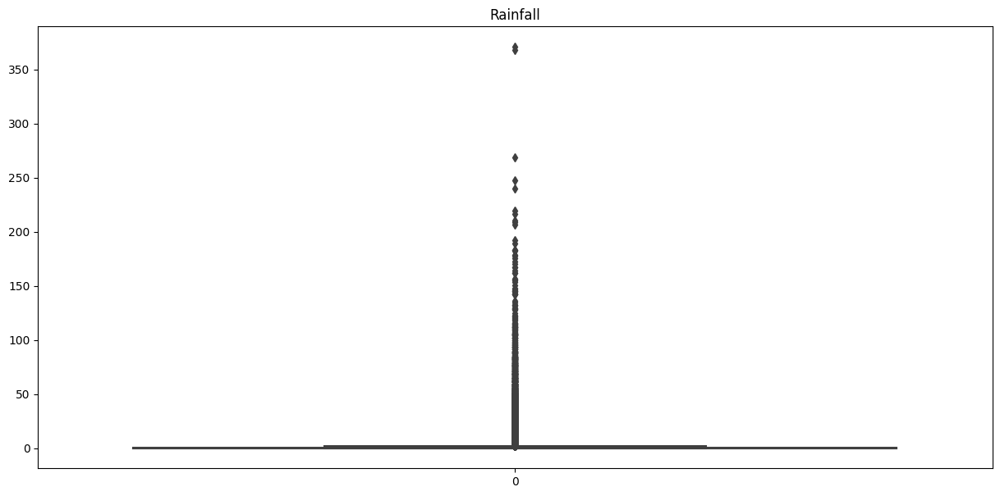

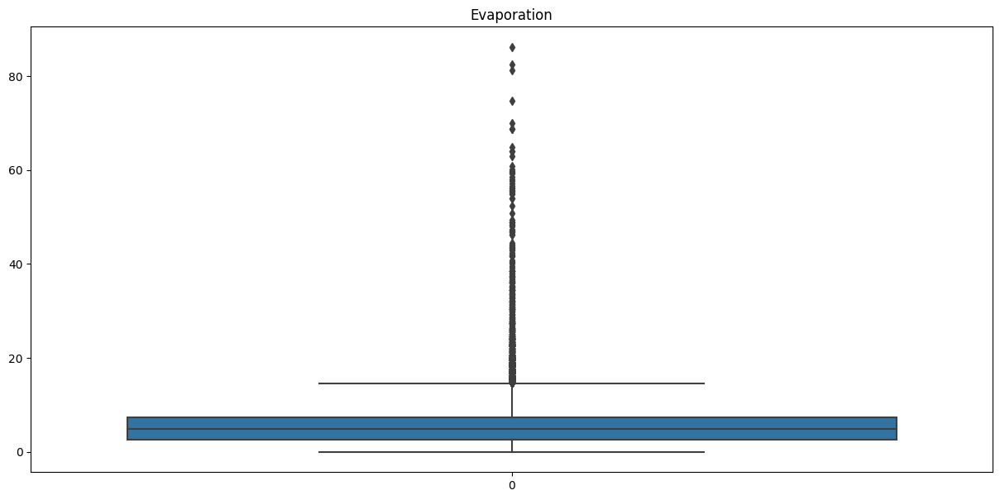

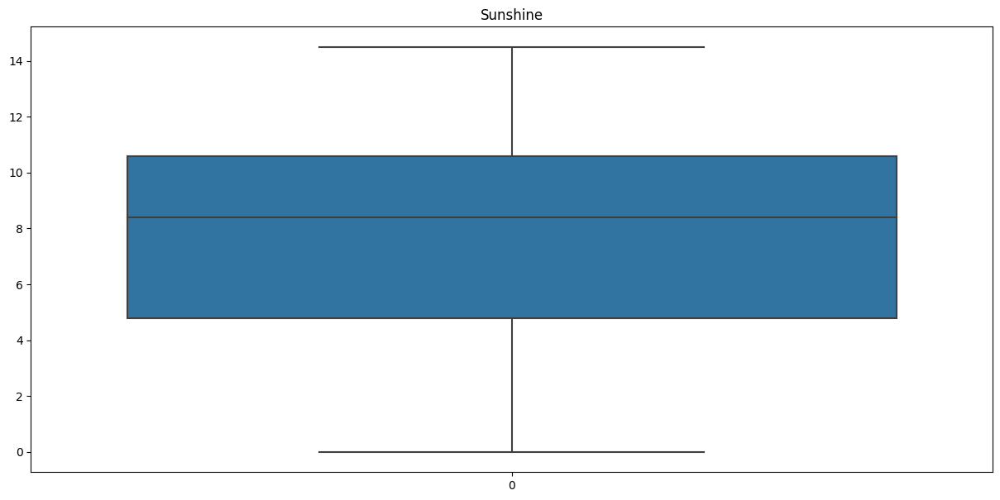

...

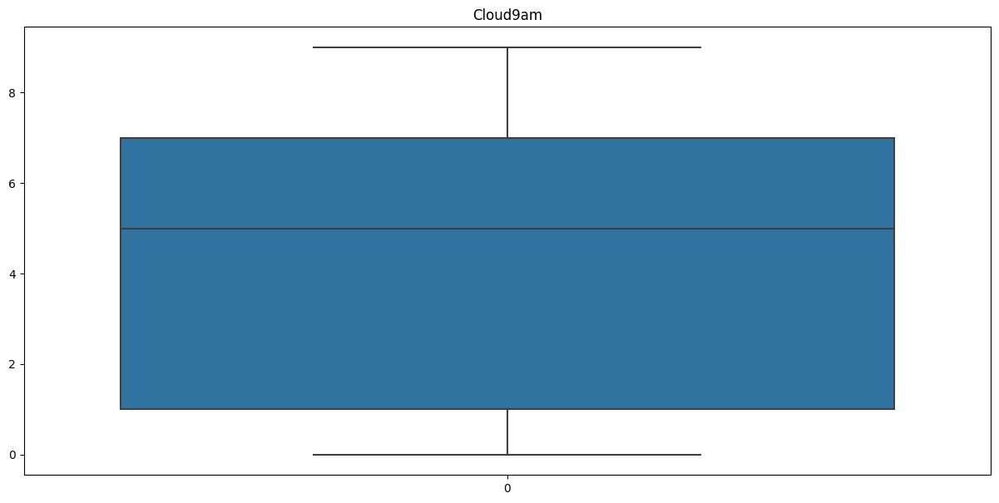

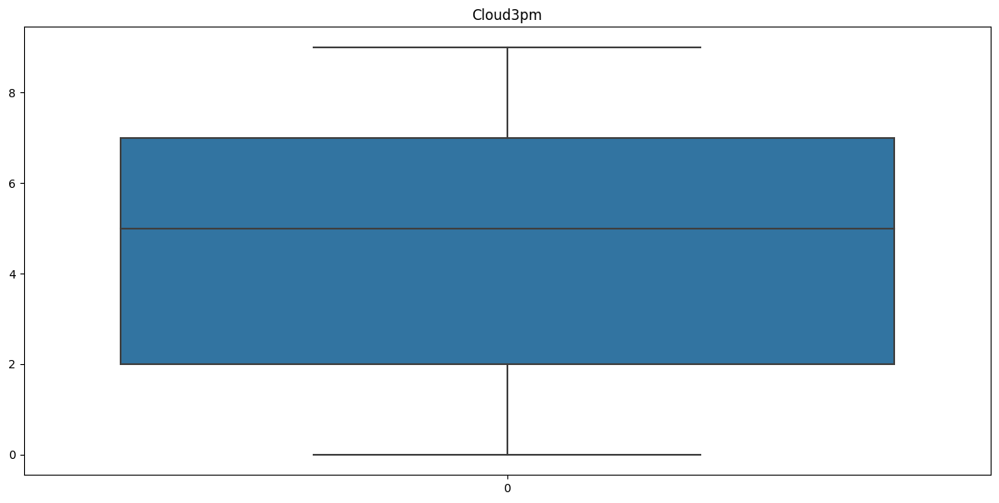

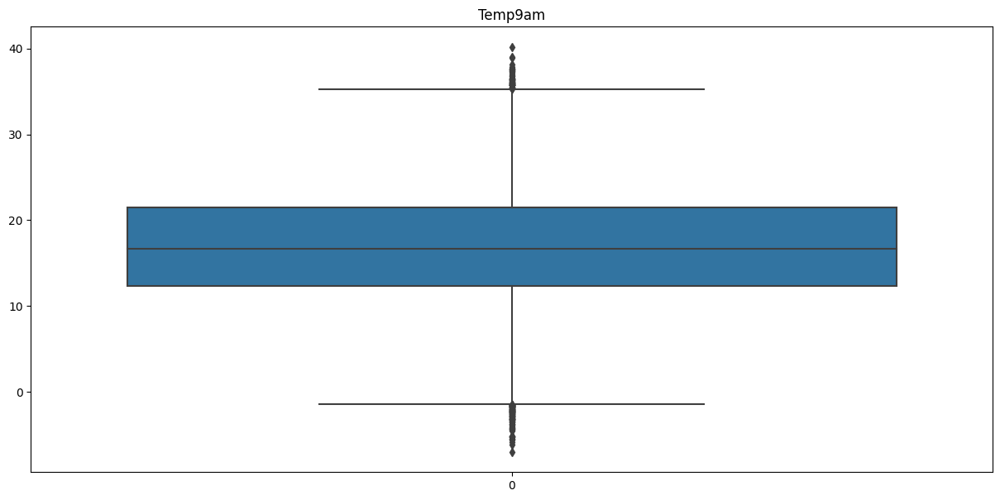

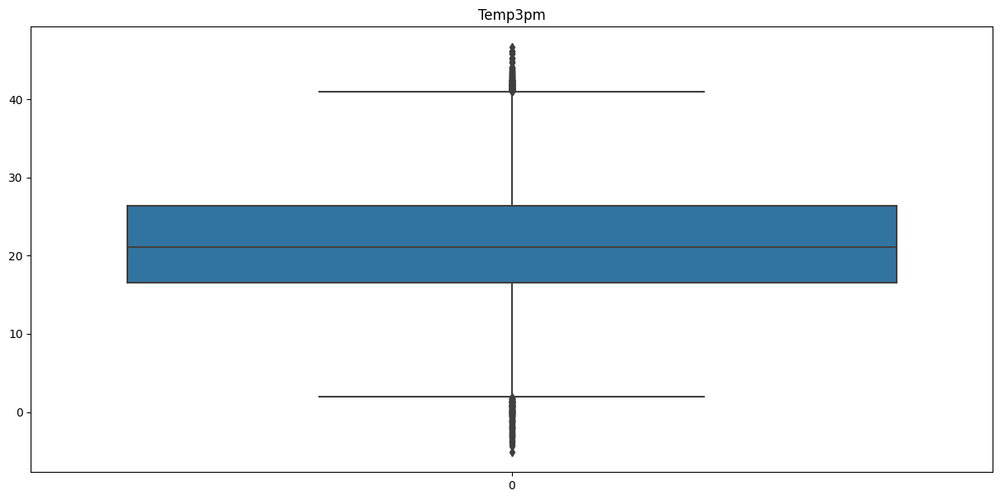

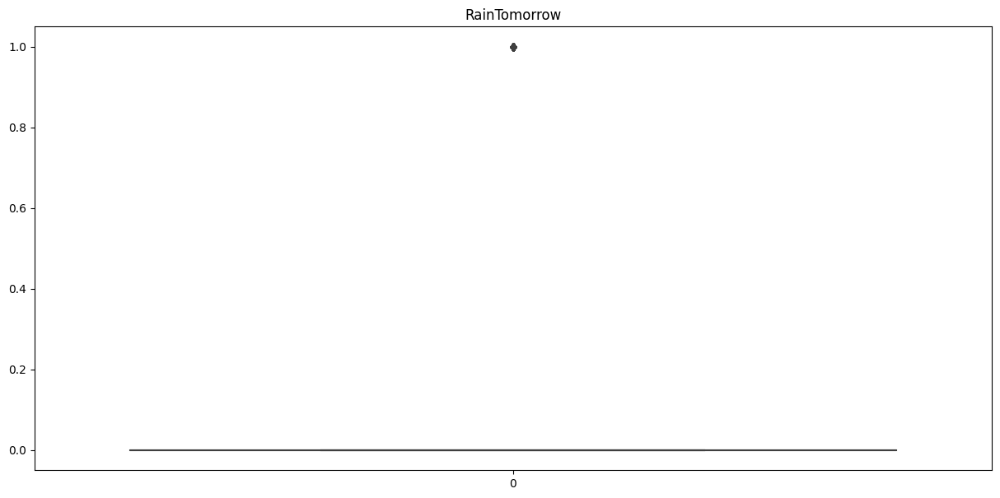

In [28]:
# Plotting distributions with respect to categories after encoding
for i in numeric_col.columns:
  plt.figure(figsize=(15,7))
  sns.boxplot(numeric_col[i])
  plt.title(i)
  plt.show()

In [29]:
# Generating correlation of data set
concat_train_df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
MinTemp,1.000000,0.737805,0.103456,0.559797,0.067918,0.182570,0.177278,0.172993,-0.240116,-0.002399,-0.467827,-0.478364,0.035622,-0.004931,0.900362,0.713479,0.083738
MaxTemp,0.737805,1.000000,-0.074137,0.680712,0.474664,0.078717,0.018177,0.050155,-0.507089,-0.510173,-0.359216,-0.447769,-0.351545,-0.314628,0.884234,0.982171,-0.159770
Rainfall,0.103456,-0.074137,1.000000,-0.066306,-0.233930,0.127362,0.087870,0.061920,0.220707,0.254335,-0.157038,-0.117709,0.206324,0.187816,0.011588,-0.079029,0.237910
Evaporation,0.559797,0.680712,-0.066306,1.000000,0.411149,0.187204,0.173661,0.127901,-0.534748,-0.480331,-0.302221,-0.331590,-0.292541,-0.269396,0.633619,0.675086,-0.147919
Sunshine,0.067918,0.474664,-0.233930,0.411149,1.000000,-0.013021,0.005513,0.030883,-0.533835,-0.720799,0.009368,-0.050799,-0.727965,-0.766399,0.280834,0.505326,-0.432715
WindGustSpeed,0.182570,0.078717,0.127362,0.187204,-0.013021,1.000000,0.583970,0.663915,-0.221952,-0.030222,-0.462233,-0.421757,0.046454,0.066954,0.159375,0.040499,0.228009
WindSpeed9am,0.177278,0.018177,0.087870,0.173661,0.005513,0.583970,1.000000,0.522770,-0.275425,-0.031341,-0.226088,-0.177975,0.022189,0.028564,0.132043,0.005051,0.090663
WindSpeed3pm,0.172993,0.050155,0.061920,0.127901,0.030883,0.663915,0.522770,1.000000,-0.148285,0.015301,-0.302781,-0.266145,0.041343,0.013376,0.162384,0.026257,0.088222
Humidity9am,-0.240116,-0.507089,0.220707,-0.534748,-0.533835,-0.221952,-0.275425,-0.148285,1.000000,0.665017,0.157659,0.203193,0.473101,0.405483,-0.476130,-0.499667,0.255380
Humidity3pm,-0.002399,-0.510173,0.254335,-0.480331,-0.720799,-0.030222,-0.031341,0.015301,0.665017,1.000000,0.000972,0.076971,0.606228,0.558402,-0.227661,-0.560079,0.444524


<Axes: >

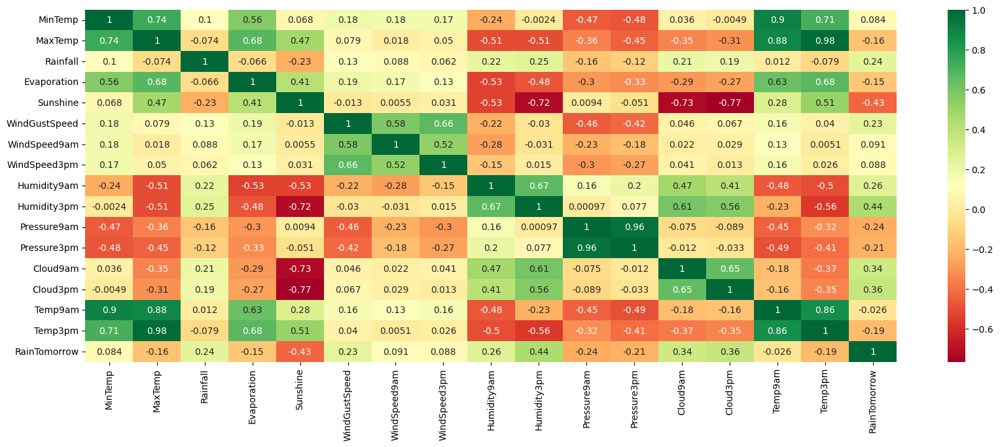

In [30]:
# Plotting Heat Map to check correlation for the data set
plt.figure(figsize=(20,7))
sns.heatmap(concat_train_df.corr(), annot=True, cmap='RdYlGn')

It is apparent that numerous predictor variables have a high degree of correlation with each other, implying the occurrence of multicollinearity. The most notable correlation is observed between Temp3pm and MaxTemp.

### One Hot Encoding

One-hot encoding is a process of converting categorical variables into numerical variables, also known as dummy variables. It involves converting each categorical value into a new binary feature, with a value of 1 indicating the presence of a specific category value in a data sample, and 0 indicating its absence. Each category value in the original feature will result in a separate feature column in the resulting one-hot encoded data.

Refer: https://www.geeksforgeeks.org/ml-one-hot-encoding-of-datasets-in-python/

In [31]:
from sklearn.preprocessing import OneHotEncoder # Library is used to encode the categorical variables for further processing

In [32]:
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


In [33]:
# Creating an instance of the OneHotEncoder class
encoder = OneHotEncoder()

# Encoding the categorical variables using the fit_transform method
encoded_data = encoder.fit_transform(concat_train_df[['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']])

# Converting the encoded data to a DataFrame
encoded_df = pd.DataFrame(encoded_data.toarray(), columns = encoder.get_feature_names_out(['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']))

# Printing the encoded DataFrame
encoded_df.head()

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [34]:
# Removing the old categorical columns from the DataFrame after encoding
concat_train_df = concat_train_df.drop(columns=['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday'])

In [35]:
# Concatenating the encoded DataFrame with the main DataFrame
final_train_df = pd.concat([concat_train_df, encoded_df], axis=1)

In [36]:
# Displaying data in the DataFrame
final_train_df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
0,13.4,22.9,0.6,7.634850,7.951930,44.0,20.0,24.0,71.0,22.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,7.4,25.1,0.0,5.765819,10.303316,44.0,4.0,22.0,44.0,25.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
2,17.5,32.3,1.0,8.104519,5.979908,41.0,7.0,20.0,82.0,33.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,14.6,29.7,0.2,8.220281,10.379909,56.0,19.0,24.0,55.0,23.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,7.7,26.7,0.0,6.363272,10.798302,35.0,6.0,17.0,48.0,19.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


### Test Train Split

Initially, data set needs to be split into features (X) and target (y).
The Test-Train Split is a commonly used procedure for evaluating the performance of a machine learning algorithm. It involves dividing a dataset into two parts: 
- #### Training Set
  
  It is used to train the machine learning model
- #### Test Set
  
  It is used to evaluate its performance.

In [37]:
from sklearn.model_selection import train_test_split # Library is required to split the data set into training set and test set

In [38]:
# Splitting the main DataFrame into X and y to perform regression
X = final_train_df.drop(columns=['RainTomorrow'], axis = 1).values
y = final_train_df['RainTomorrow'].values

In [39]:
X

array([[13.4, 22.9,  0.6, ...,  0. ,  1. ,  0. ],
       [ 7.4, 25.1,  0. , ...,  1. ,  1. ,  0. ],
       [17.5, 32.3,  1. , ...,  0. ,  1. ,  0. ],
       ...,
       [ 2.8, 23.4,  0. , ...,  0. ,  1. ,  0. ],
       [ 3.6, 25.3,  0. , ...,  0. ,  1. ,  0. ],
       [ 5.4, 26.9,  0. , ...,  0. ,  1. ,  0. ]])

In [40]:
y

array([0., 0., 0., ..., 0., 0., 0.])

In [41]:
# Splitting the Data set into 80% Training set and 20% Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [42]:
X_train

array([[19.5, 26.2,  0. , ...,  0. ,  1. ,  0. ],
       [ 6.9, 23.5,  0. , ...,  0. ,  1. ,  0. ],
       [ 5.7, 16.2,  0. , ...,  1. ,  1. ,  0. ],
       ...,
       [15.1, 20.1,  0. , ...,  0. ,  1. ,  0. ],
       [15.9, 39.7,  0. , ...,  0. ,  1. ,  0. ],
       [13.9, 25.8,  0.2, ...,  1. ,  1. ,  0. ]])

In [43]:
X_test

array([[12.1, 23.3,  0. , ...,  0. ,  1. ,  0. ],
       [10. , 20.3,  0. , ...,  0. ,  1. ,  0. ],
       [12.3, 21.4,  0. , ...,  0. ,  1. ,  0. ],
       ...,
       [ 6.6, 20.8,  0. , ...,  0. ,  1. ,  0. ],
       [14.9, 33.2,  0. , ...,  0. ,  1. ,  0. ],
       [ 6.1, 16.9,  2. , ...,  0. ,  0. ,  1. ]])

In [44]:
y_train

array([0., 0., 0., ..., 0., 0., 0.])

In [45]:
y_test

array([0., 0., 0., ..., 0., 0., 0.])

### Feature Scaling

Feature scaling is a technique in data preprocessing where the values of the features are transformed and standardized to have a similar range of values. This is done to bring all the features to the same level of magnitude, so that the model does not get swayed by the feature with a large magnitude. There are two common feature scaling techniques: 
- #### Min-Max Scaling

 Min-Max scaling scales the values between 0 and 1
- #### Standardization 

  It transforms the values to have a mean of 0 and a standard deviation of 1.

Refer: https://www.analyticsvidhya.com/blog/2021/05/feature-scaling-techniques-in-python-a-complete-guide/

In [46]:
from sklearn.preprocessing import MinMaxScaler # Library is required to perform feature scaling using MinMaxScaler

In [47]:
# Fit MinMaxScaler on the training data
scaler = MinMaxScaler()
scaler.fit(X_train)

# Transform both the Training and Test data
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [48]:
X_train

array([[0.66037736, 0.58045977, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.36320755, 0.52873563, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.33490566, 0.38888889, 0.00833132, ..., 1.        , 1.        ,
        0.        ],
       ...,
       [0.55660377, 0.46360153, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.5754717 , 0.83908046, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.52830189, 0.57279693, 0.00886591, ..., 1.        , 1.        ,
        0.        ]])

In [49]:
X_test

array([[0.48584906, 0.52490421, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.43632075, 0.46743295, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.49056604, 0.48850575, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.35613208, 0.47701149, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.55188679, 0.71455939, 0.00833132, ..., 0.        , 1.        ,
        0.        ],
       [0.34433962, 0.40229885, 0.01367724, ..., 0.        , 0.        ,
        1.        ]])

### Visualizing the Training and Test Set

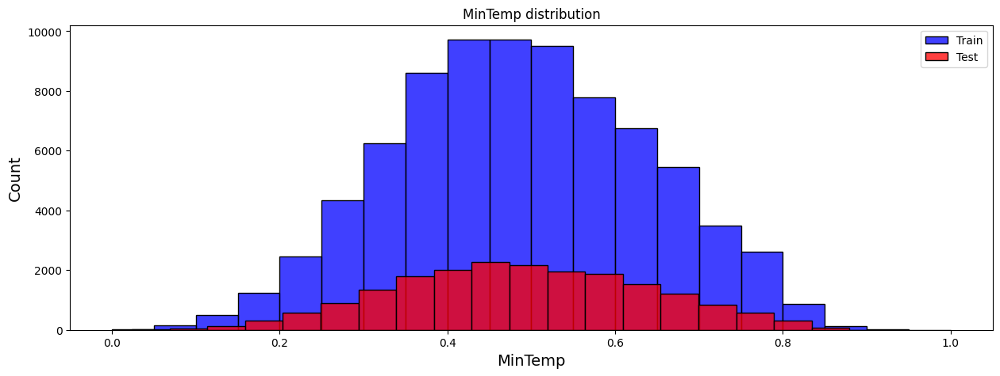

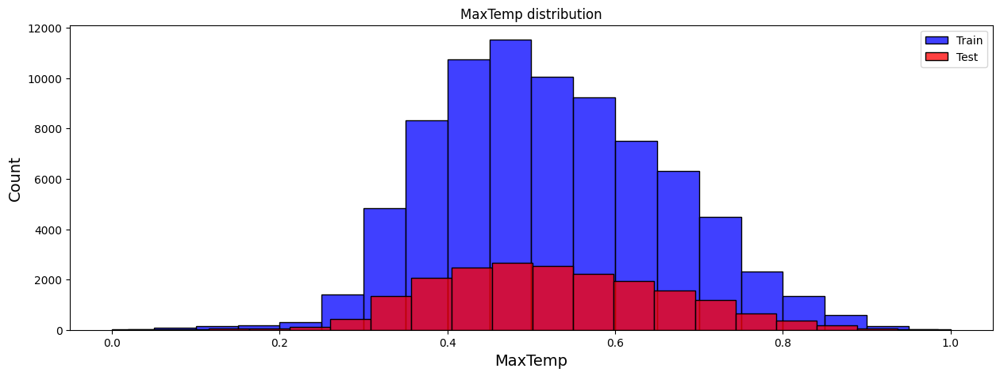

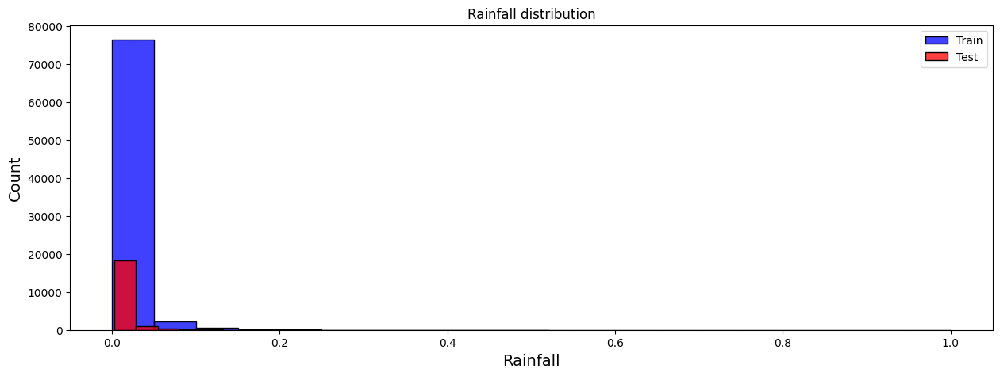

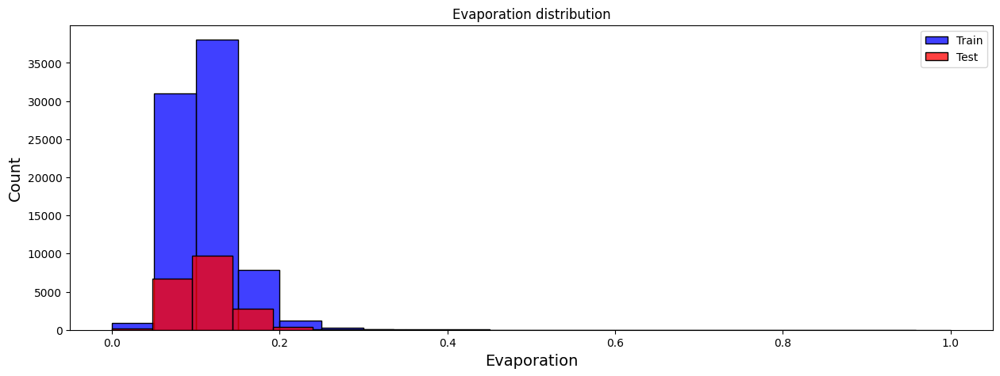

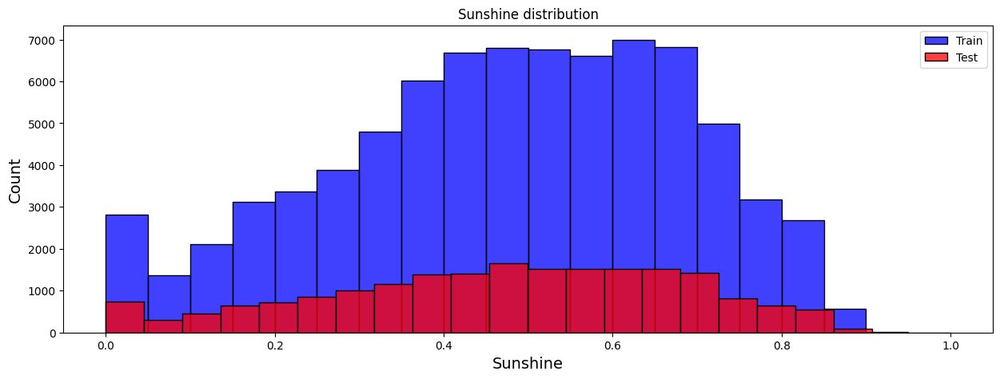

...

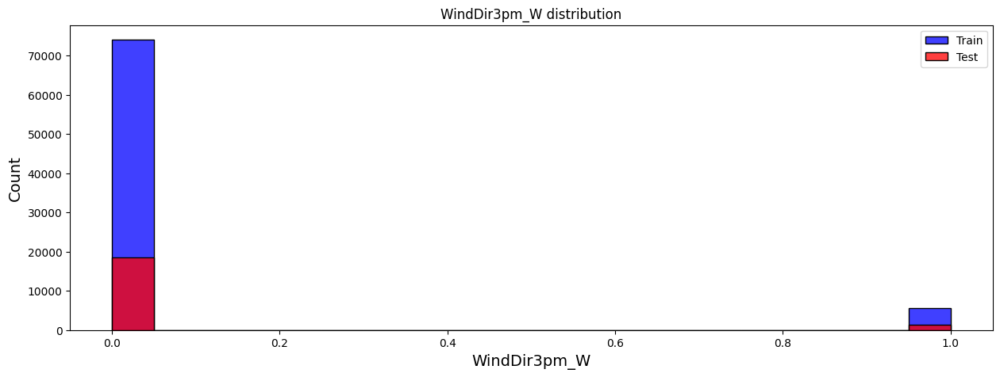

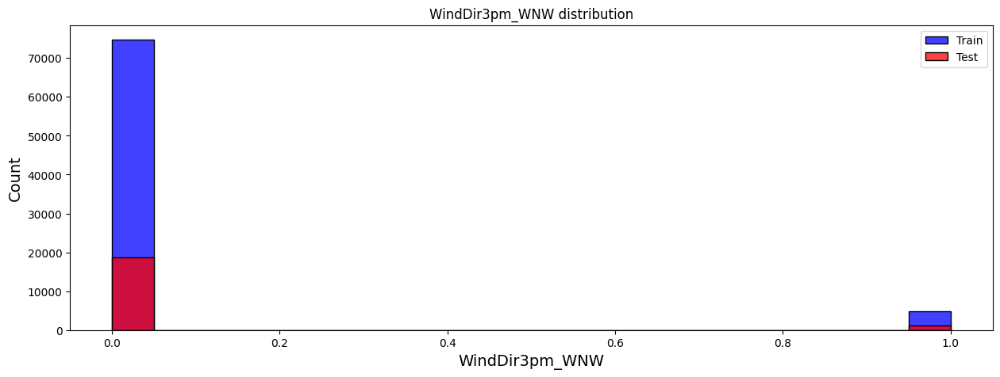

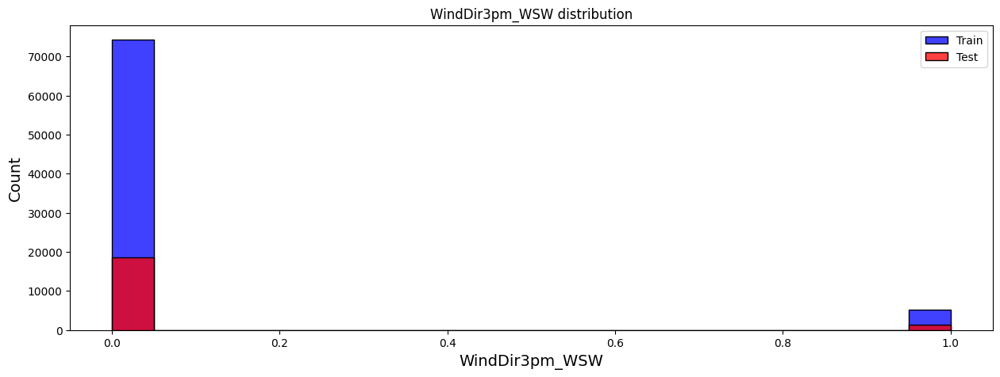

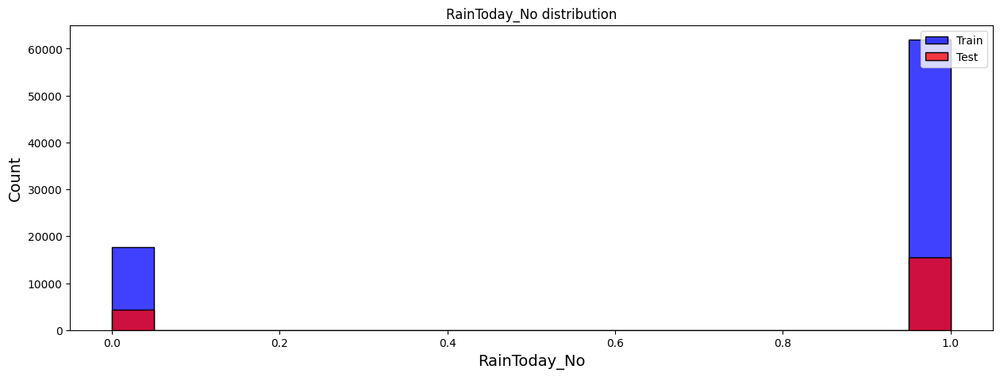

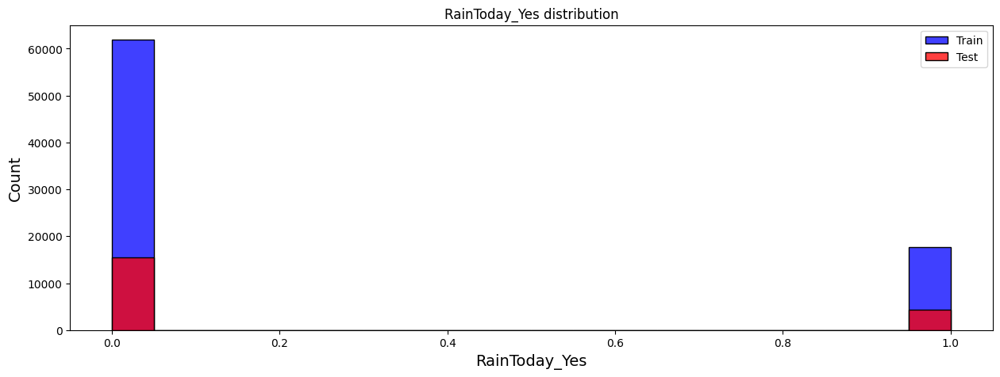

In [50]:
# Preparing DataFrames for Training and Test set for visualization
X_test_plot = pd.DataFrame(X_test, columns = final_train_df.drop(columns = ['RainTomorrow'], axis = 1).columns)
X_train_plot = pd.DataFrame(X_train, columns = final_train_df.drop(columns = ['RainTomorrow'], axis = 1).columns)

# Plotting the Training and Test set to visualize the data distribution
for c in X_test_plot.columns:
  plt.figure(figsize=(15,5))
  sns.histplot(X_train_plot[c], bins=20, color = 'blue', label = 'Train')
  sns.histplot(X_test_plot[c], bins=20, color = 'red', label = 'Test')
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

## Logistic Regression Model

Logistic Regression is a statistical method used for predicting binary outcomes (Yes/No, True/False, 1/0, etc.) based on one or more predictor variables. It is a type of regression analysis where the response variable is binary or categorical, and the predictors can be either categorical or continuous. The goal of logistic regression is to determine the relationship between the predictor variables and the binary response variable and to estimate the probability of a certain outcome.

In [51]:
# Fitting the Logistic Regression to the Training Set
from sklearn.linear_model import LogisticRegression # Library is required to perform Logistic Regression
from sklearn.metrics import classification_report # Library is required to build a text report showing the main classification metrics
from sklearn.metrics import confusion_matrix # Library is required to plot a Confusion Matrix
from sklearn.metrics import r2_score

In [52]:
# Train the Logistic Regression Model
regressor = LogisticRegression(solver='saga')
regressor.fit(X_train, y_train)

LogisticRegression(solver='saga')

In [53]:
# Predicting the Test set Results using the Logistic Regression Model
y_pred = regressor.predict(X_test)
y_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [54]:
# Calculating Train and Test Score
train_score = regressor.score(X_train , y_train)
test_score = regressor.score(X_test , y_test)
print("Train Score: ", round(train_score, 5))
print("Test Score: ", round(test_score,5))

Train Score:  0.84943
Test Score:  0.85013


In [55]:
# Assessing the Prediction Values
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-Squared:", r2)

Mean Absolute Error: 0.1498693729903537
Mean Squared Error: 0.1498693729903537
R-Squared: 0.13856575110962543


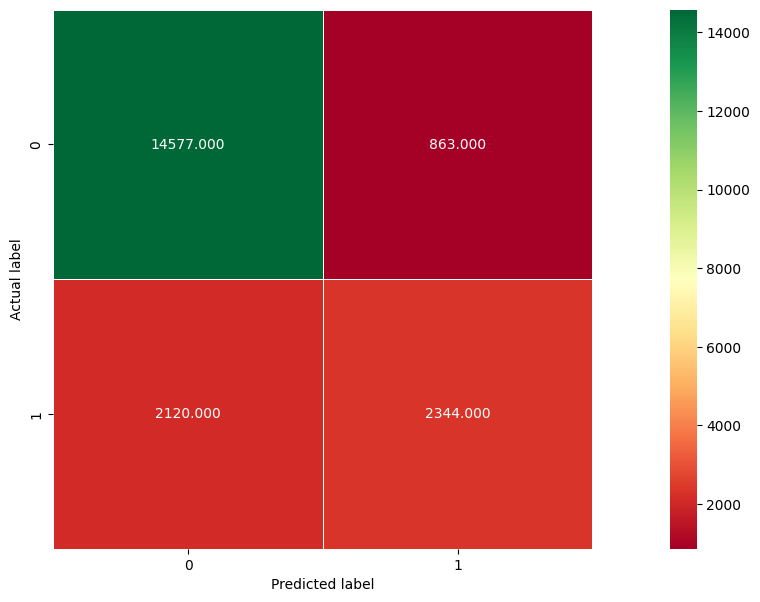

In [56]:
# Plotting the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(20,7))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'RdYlGn');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');

In [57]:
# Generating a Classification Report based on the Actual and Predicted values
report = pd.DataFrame(classification_report(y_test, y_pred, output_dict = True))
report

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.873031,0.730901,0.850131,0.801966,0.841155
recall,0.944106,0.525090,0.850131,0.734598,0.850131
f1-score,0.907179,0.611133,0.850131,0.759156,0.840783
support,15440.000000,4464.000000,0.850131,19904.000000,19904.000000


## Interpreting Regressor Coefficients

In [58]:
import statsmodels.api as sm # Library is required to calculate OLS for finding the P values to check the significant features

In [59]:
# Fitting the OLS model upon the Training set
model = sm.OLS(y, X).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.344
Model:                            OLS   Adj. R-squared:                  0.344
Method:                 Least Squares   F-statistic:                     474.5
Date:                Thu, 30 Mar 2023   Prob (F-statistic):               0.00
Time:                        02:22:12   Log-Likelihood:                -33251.
No. Observations:               99516   AIC:                         6.672e+04
Df Residuals:                   99405   BIC:                         6.778e+04
Df Model:                         110                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0023      0.001     -4.104      0.000      -0.003      -0.001
x2             0.0007      0.001      0.752      0.452      -0.001       0.003
x3             0.0021      0.000     13.947      0.000       0.002       0.002
x4             0.0018      0.000      3.801      0.000       0.001       0.003
x5            -0.0237      0.001    -34.215      0.000      -0.025      -0.022
x6             0.0077      0.000     56.422      0.000       0.007       0.008
x7            -0.0003      0.000     -1.830      0.067      -0.001    2.34e-05
x8            -0.0042      0.000    -22.868      0.000      -0.005      -0.004
x9            -0.0006      0.000     -5.306      0.000      -0.001      -0.000
x10            0.0083      0.000     59.788      0.000       0.008       0.009
x11            0.0153      0.001     19.422      0.000       0.014       0.017
x12           -0.0240      0.001    -30.517      0.000      -0.026      -0.022
x13           -0.0036      0.001     -5.260      0.000      -0.005      -0.002
x14            0.0029      0.001      3.635      0.000       0.001       0.004
x15           -0.0005      0.001     -0.677      0.498      -0.002       0.001
x16            0.0017      0.001      1.674      0.094      -0.000       0.004
x17            0.3223      0.010     33.101      0.000       0.303       0.341
x18            0.1995      0.011     18.890      0.000       0.179       0.220
x19            0.2741      0.009     29.241      0.000       0.256       0.292
x20            0.2878      0.010     30.008      0.000       0.269       0.307
x21            0.2298      0.010     23.819      0.000       0.211       0.249
x22            0.1730      0.010     17.918      0.000       0.154       0.192
x23            0.2372      0.009     25.215      0.000       0.219       0.256
x24            0.2751      0.010     28.043      0.000       0.256       0.294
x25            0.2336      0.010     23.091      0.000       0.214       0.253
x26            0.2304      0.009     24.778      0.000       0.212       0.249
x27            0.3137      0.010     32.675      0.000       0.295       0.333
x28            0.2148      0.010     21.274      0.000       0.195       0.235
x29            0.2242      0.010     23.194      0.000       0.205       0.243
x30            0.2025      0.010     20.271      0.000       0.183       0.222
x31            0.1600      0.010     15.505      0.000       0.140       0.180
x32            0.1413      0.009     15.208      0.000       0.123       0.159
x33            0.1894      0.012     15.500      0.000       0.165       0.213
x34            0.1704      0.010     17.654      0.000       0.151       0.189
x35            0.2281      0.010     21.934      0.000       0.208       0.248
x36            0.1843      0.010     18.875      0.000       0.165       0.203
x3

In [60]:
# Sorting the features and their coefficients based on the magnitude of the coefficients
coef_df = pd.DataFrame({'Feature': X_train_plot.columns, 'Coefficient': regressor.coef_.flatten()})
coef_df['Abs_Coefficient'] = abs(coef_df['Coefficient'])
coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False)
coef_df = coef_df[['Feature', 'Coefficient']]
print(coef_df)

             Feature  Coefficient
11       Pressure3pm    -8.357195
9        Humidity3pm     7.920669
5      WindGustSpeed     6.850979
10       Pressure9am     4.677137
2           Rainfall     2.944566
..               ...          ...
92   WindGustDir_SSW     0.007146
122    WindDir3pm_SE    -0.006879
72    WindGustDir_NW     0.005803
88    WindGustDir_NW     0.005803
12          Cloud9am    -0.002565

[131 rows x 2 columns]


- A negative coefficient for a feature indicates that an increase in the feature value is associated with a decrease in the dependent variable, while a positive coefficient indicates the opposite. 
- The magnitude of the coefficient indicates the strength of the relationship between the feature and the dependent variable.
- Pressure3PM has the highest negative magnitude and Humidity3PM has the highest positive magnitude of coefficients. 

## Light Gradient Boosting Machine

In [61]:
import lightgbm as lgb

# Initializing LightGBM model object with given parameters
params = {'boosting_type': 'gbdt', 'objective': 'binary', 'metric': 'binary_logloss', 'num_leaves': 31, 'learning_rate': 0.05}
lgb_model = lgb.LGBMClassifier(**params)

# Fitting the model on X_train and y_train
lgb_model.fit(X_train, y_train)

# Making predictions on X_train and X_test
y_test_gbm_pred = lgb_model.predict(X_test)

In [62]:
# Assessing the Prediction Values
mae = mean_absolute_error(y_test, y_test_gbm_pred)
mse = mean_squared_error(y_test, y_test_gbm_pred)
r2 = r2_score(y_test, y_test_gbm_pred)

# Printing the results
print("Mean Absolute Error for LightGBM Tree Model:", mae)
print("Mean Squared Error for LightGBM Tree Model:", mse)
print("R-Squared for LightGBM Tree Model:", r2)

Mean Absolute Error for LightGBM Tree Model: 0.14394091639871381
Mean Squared Error for LightGBM Tree Model: 0.14394091639871381
R-Squared for LightGBM Tree Model: 0.17264192991253002


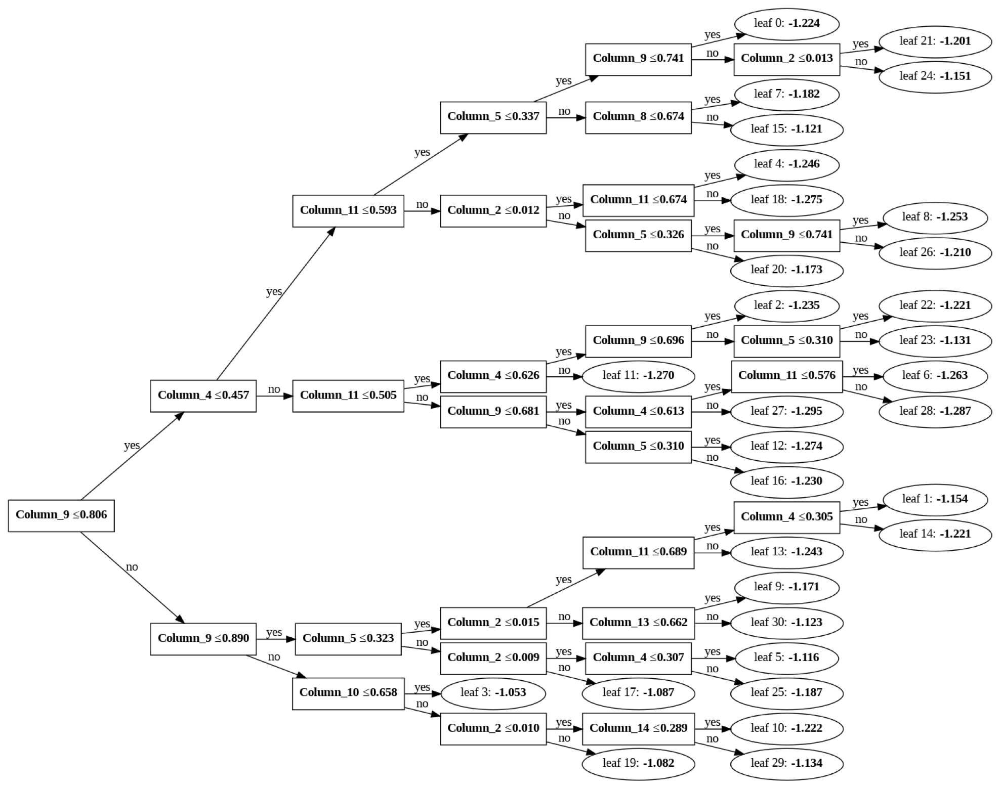

In [63]:
# Visualizing the LightGBM Decision Tree with all its nodes and leaves
fig, ax = plt.subplots(figsize=(50, 20))
lgb.plot_tree(lgb_model, tree_index = 0, ax=ax)
plt.show()

In [64]:
from sklearn.metrics import accuracy_score
# Calculating the accuracy of the model
print('Accuracy Score for Test set = ', round(accuracy_score(y_test, y_test_gbm_pred),4))

Accuracy Score for Test set =  0.8561


## Interpret the Nodes

In [65]:
# Fetching numerical feature importances of the LightGBM model
tree_importances = list(lgb_model.feature_importances_)

# Listing out tuples with variables and their importance
feature_importances = [(feature, round(importance, 2))
    for feature, importance in zip(X_train_plot.columns, tree_importances)
]

# Sorting the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [66]:
# Inserting the sorted Feature Importance data into a DataFrame
feature_imp = pd.DataFrame(feature_importances, columns=['Feature', 'Importance'])

In [67]:
# Printing the Features and their Importance
feature_imp

,Feature,Importance
0,Pressure3pm,392
1,Humidity3pm,354
2,WindGustSpeed,300
3,Sunshine,247
4,Rainfall,164
...,...,...
126,WindDir9am_WNW,0
127,WindDir9am_WSW,0
128,WindDir3pm_E,0
129,WindDir3pm_ESE,0


The nodes of LightGBM Model is interpreted as follows:

- In this case, the feature importance data shows that the "Pressure3pm" feature has the highest importance score of 392, followed by "Humidity3pm" with a score of 354, "WindGustSpeed" with a score of 300, "Sunshine" with a score of 247, and "Rainfall" with a score of 164.

- This suggests that the "Pressure3pm" feature is the most important feature in the LightGBM model's decision-making process, followed by "Humidity3pm", "WindGustSpeed", "Sunshine", and "Rainfall" in descending order of importance.

- For example, in this case, the feature "Pressure3pm" has the highest importance score of 392, which indicates that this feature alone contributes significantly to the model's predictions. On the other hand, "WindDir3pm_E" has a much lower importance score of 0, suggesting that it has almost negligent impact on the model's predictions.

## H2O AutoML

H2O AutoML is an automated machine learning platform offered by H2O.ai. It automates the end-to-end machine learning process, including data pre-processing, feature engineering, model selection, hyperparameter tuning, and model deployment.

H2O AutoML automates the process of selecting the best algorithms and hyperparameters for a given dataset by training and comparing multiple models, reducing the time and effort required for manual model selection. It supports a wide range of supervised learning tasks, such as classification and regression, and can handle large datasets with ease.

Refer: https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html

In [68]:
# Replacing 0s and 1s in the target variable with N and Y respectively so that it can be considered as a Binary Model
automl_train_df['RainTomorrow'] = automl_train_df['RainTomorrow'].replace({0: 'N', 1: 'Y'})

In [69]:
# Importing H2O Libraries
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch

In [70]:
# Setting up the minimum memory size for the AutoML and maximum runtime
min_mem_size = 6
run_time = 222

In [71]:
# Calculating the minimum memory size for the AutoML
import psutil
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

5


In [72]:
import random

# Generating a random port number to start the H2O server on
port_no = random.randint(5555, 55555)

# Starting the H2O server and initializing it
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:7686..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmprd9erkzh
  JVM stdout: /tmp/tmprd9erkzh/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmprd9erkzh/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:7686
Connecting to H2O server at http://127.0.0.1:7686 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_40qwr4
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [73]:
# Converting the DataFrame to H2O DataFrame
h2o_df = h2o.H2OFrame(automl_train_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [74]:
# Splitting the data into training and testing datasets
df_train, df_test = h2o_df.split_frame([0.80])

In [75]:
# Setting up the AutoML Model
def autoML(df_train, df_test):
    X = df_train.columns
    y = "RainTomorrow"
    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)
    aml.train(x=X, y=y, training_frame=df_train)  # Training the dataset on different models
    return df_train, df_test, aml

In [76]:
# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}
    # Looping through the models to get the best model index
    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    # Looping through the models to get the GLM model index
    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [77]:
# Training the AutoML Model
autoML = autoML(df_train, df_test)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [78]:
# Outputting the leaderboard of the AutoML model
autoML[2].leaderboard

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_3_AutoML_1_20230330_22232,0.898909,0.312913,0.764492,0.206524,0.311645,0.0971225
StackedEnsemble_AllModels_2_AutoML_1_20230330_22232,0.898809,0.313,0.764353,0.198112,0.311694,0.0971534
StackedEnsemble_BestOfFamily_4_AutoML_1_20230330_22232,0.898077,0.314135,0.762213,0.206641,0.312388,0.0975864
StackedEnsemble_BestOfFamily_3_AutoML_1_20230330_22232,0.898026,0.313999,0.762033,0.20554,0.312234,0.0974898
StackedEnsemble_AllModels_1_AutoML_1_20230330_22232,0.897374,0.314782,0.762152,0.197444,0.312638,0.0977424
StackedEnsemble_BestOfFamily_2_AutoML_1_20230330_22232,0.89552,0.316972,0.759382,0.208523,0.313773,0.0984532
StackedEnsemble_BestOfFamily_1_AutoML_1_20230330_22232,0.89511,0.318024,0.757555,0.202822,0.314039,0.0986207
GBM_2_AutoML_1_20230330_22232,0.89315,0.321003,0.753924,0.205431,0.315409,0.0994828
GBM_5_AutoML_1_20230330_22232,0.893122,0.321279,0.752799,0.205976,0.315158,0.0993246
GBM_1_AutoML_1_20230330_22232,0.891775,0.323817,0.751574,0.212371,0.316443,0.100136


In [79]:
# Getting the best model from the AutoML leaderboard
autoML_model = getBestModel(autoML[2])
print(autoML_model)

7
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_2_AutoML_1_20230330_22232


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    110                110                         159355                 7            7            7             42            128           98.6636

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.06475591136368244
RMSE: 0.25447182823189374
LogLoss: 0.22432357137110626
Mean Per-Class Error: 0.12794992790087445
AUC: 0.9589846541465404
AUCPR: 0.9014050495664973
Gini: 0.9179693082930809

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3799208065722444
       N      Y      Error    Rate
-----  -----  -----  -------  ---------------

In [80]:
# Making predictions using the best model
autoML_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict,N,Y
Y,0.335892,0.664108
N,0.870394,0.129606
Y,0.190343,0.809657
N,0.990413,0.00958672
N,0.967932,0.032068
N,0.966384,0.0336158
N,0.984177,0.0158228
N,0.98897,0.0110296
N,0.983856,0.0161441
N,0.723033,0.276967


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_2_AutoML_1_20230330_22232

,N,Y,Error,Rate
N,13380.0,2016.0,0.1309,(2016.0/15396.0)
Y,1174.0,3303.0,0.2622,(1174.0/4477.0)
Total,14554.0,5319.0,0.1605,(3190.0/19873.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

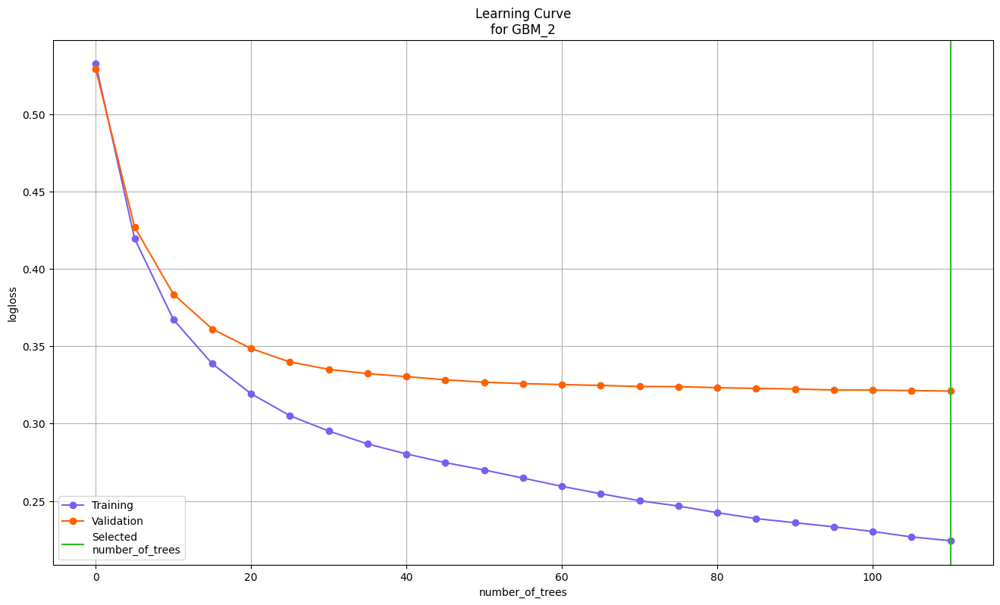

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

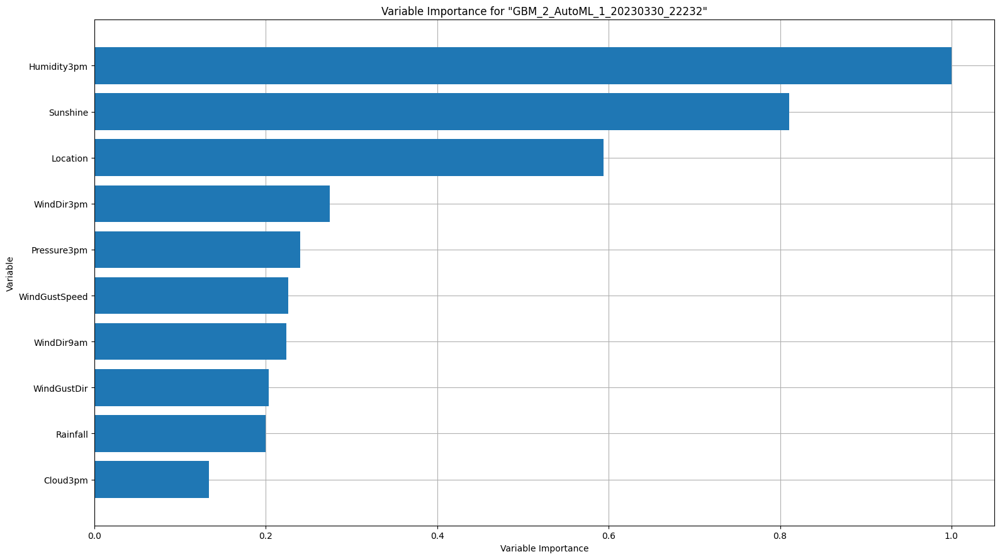

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

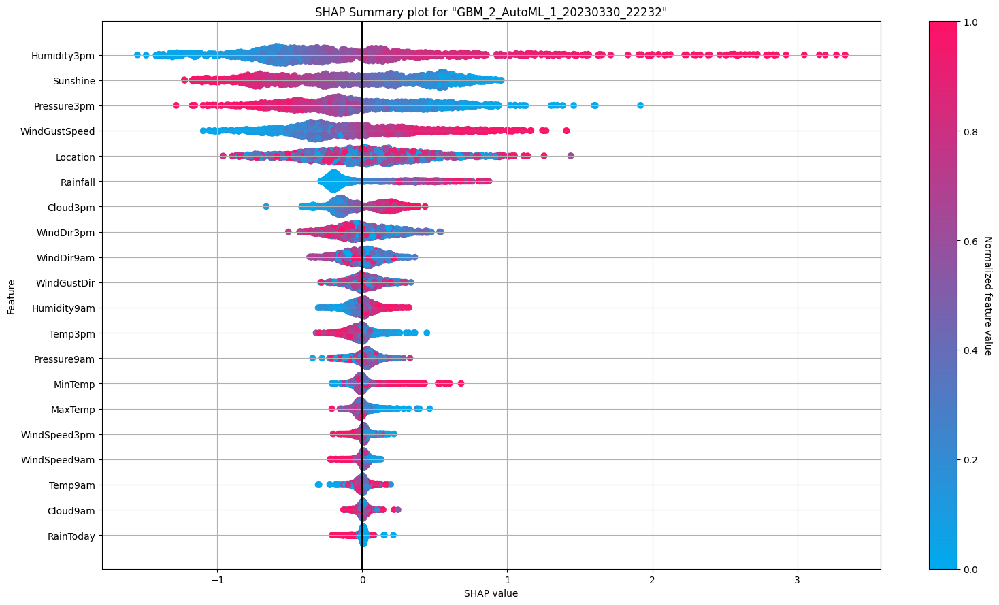

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

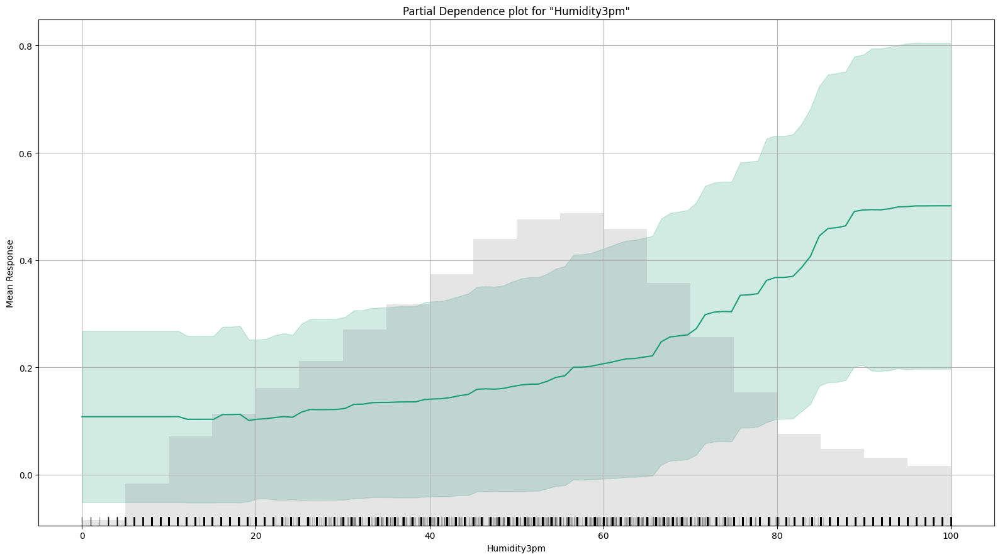

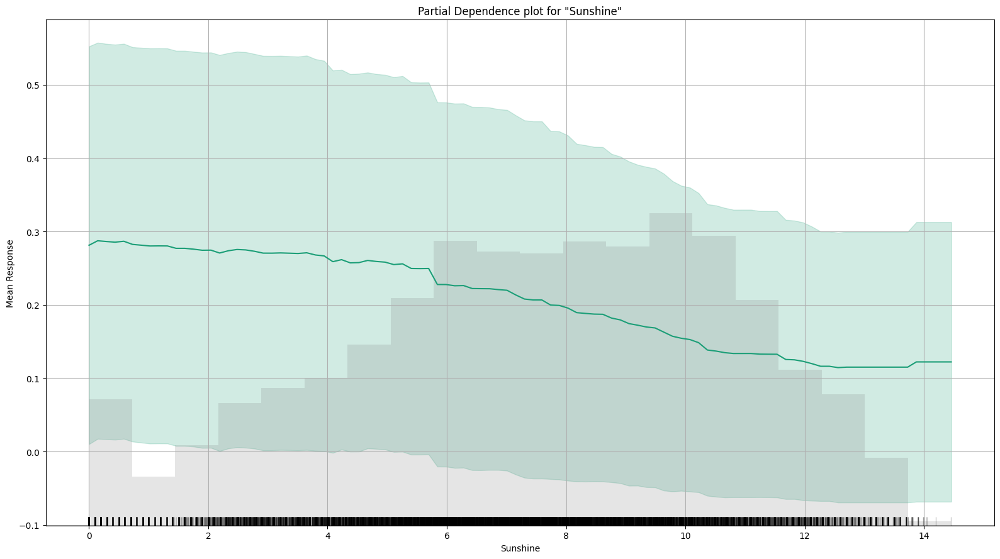

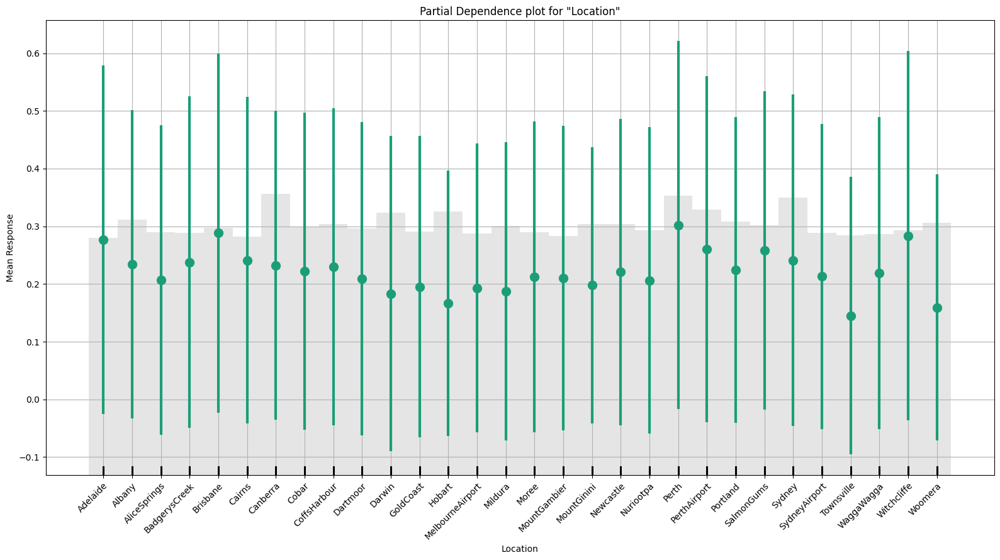

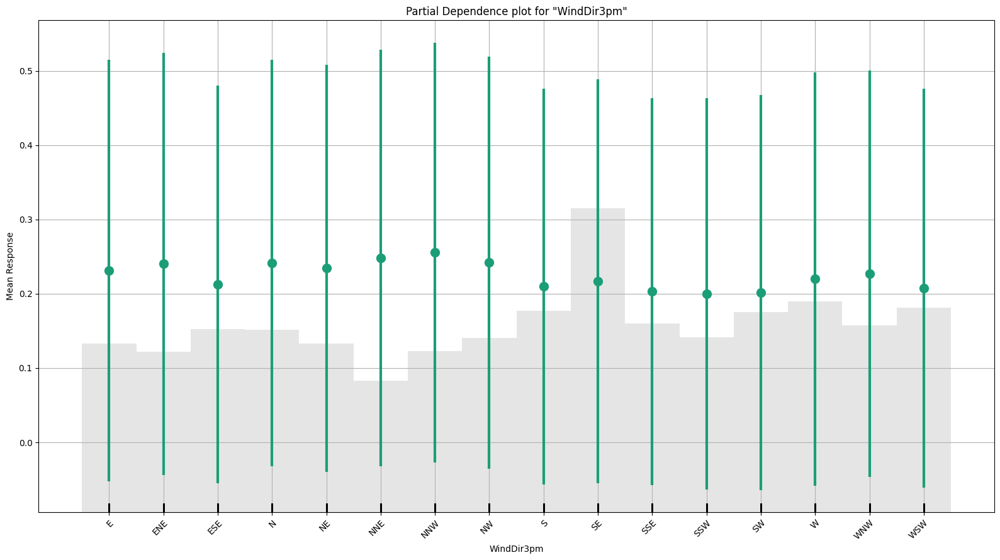

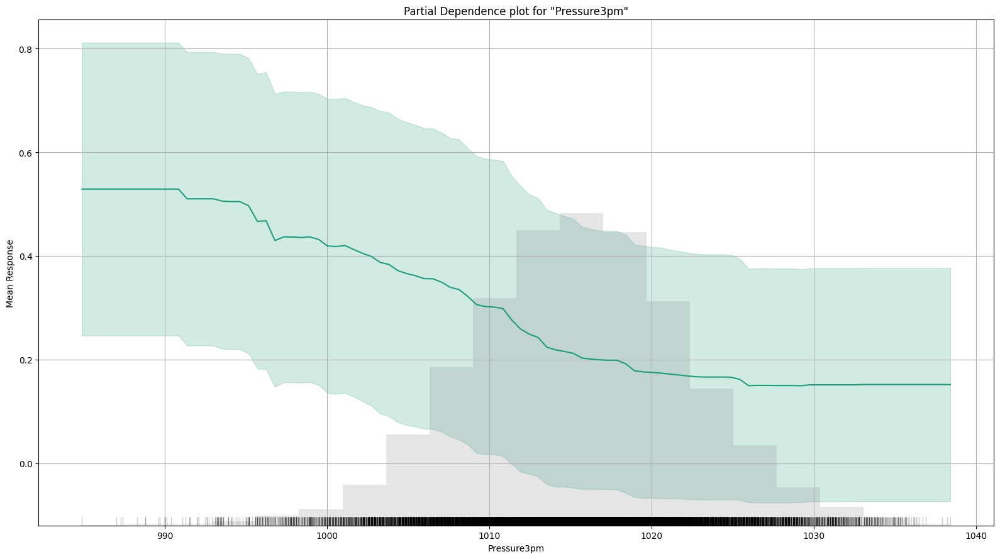

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_2_AutoML_1_20230330_22232

,N,Y,Error,Rate
N,13380.0,2016.0,0.1309,(2016.0/15396.0)
Y,1174.0,3303.0,0.2622,(1174.0/4477.0)
Total,14554.0,5319.0,0.1605,(3190.0/19873.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

In [81]:
# Generating explanations for the predictions made by the best model
autoML_model.explain(autoML[1])

### H2O Model SHAP Analysis

The SHAP Model for H2O AutoML Model is interpreted as follows:

The important features contributing to the SHAP analysis are as follows:
- Humidity3PM
- Sunshine
- Pressure3PM
- WindGustSpeed
- Location

The plot is interpreted as follows:
1. The independent variable Humidity3PM has a huge cluster of points to the left of zero with some outliers on the right. It has a directly proportional relationship with the SHAP values.

2. The SHAP values for Sunshine is decreasing with increase in feature value. It has majority of its points below zero.

3. Pressure3PM also has an inverse relationship with the SHAP value. It has a few outliers with positive SHAP value but they're mostly grouped to the left.

4. WindGustSpeed's points are spread on both the sides with an increase in SHAP value based on the increase in Feature value.

5. Location was a feature which did not have a high feature importance in Logistic and LightGBM models. It has a huge variety of data which indicates a complex relationship between the SHAP and feature values.

### H2O Model Partial Dependence Plot

The Partial Dependence Plot for H2O Model is interpreted as follows:
1. As shown above, the partial dependence plot for Humidity3PM shows a curved line with positive slope which indicates multicollinearity with other variables and positive relationship with target variable.

2. Sunshine has a negative curve which means that it has negative relationship with the target variable and the height indicates a high magnitude of impact on the prediction.

3. Location, which is a categorical variable whose PDP plot depicts all the locations on X-axis and its mean response on the Y-axis. Locations like Adelaide, Brisbane and Perth have strong weightage on the final prediction.

4. WindDir3PM, which is also a categorical variable with a varied range of mean responses for each feature type.

5. WindGustSpeed has a positive curve which starts to become constant as the feature value increases. It has a significant magnitude along with positive relationship with the target variable.

## Analyzing Model Interpretability Methods

### SHAP Analysis
SHAP (SHapley Additive exPlanations) Analysis is a method used to explain the output of any machine learning model. It is a game-theoretic approach that provides a way to attribute the prediction of a model to the input features of the data.

SHAP Analysis aims to identify the contribution of each feature to the final prediction by calculating the Shapley values, which are the average marginal contributions of each feature over all possible subsets of the features. Shapley values provide a fair way to distribute the credit of the prediction among the input features.

Refer: https://towardsdatascience.com/shap-a-reliable-way-to-analyze-your-model-interpretability-874294d30af6

### Logistic Regression Model SHAP Analysis

In [82]:
# Generating new DataFrames for train and test set for further use
X_train_df = pd.DataFrame(X_train, columns=X_train_plot.columns)
X_test_df = pd.DataFrame(X_test, columns=X_test_plot.columns)

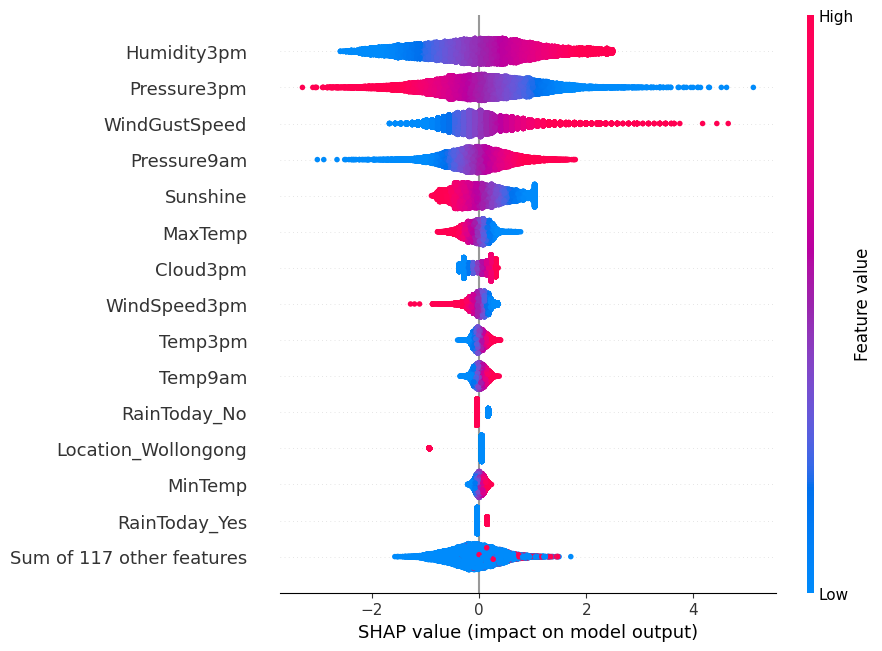

In [83]:
# Using SHAP library to explain the predictions made by logistic regression model
log_explainer = shap.Explainer(regressor, X_train)
log_shap_values = log_explainer(X_test_df)
shap.plots.beeswarm(log_shap_values, max_display=15)

The important features contributing to the prediction in Logistic Model are as follows:
- Humidity3PM
- Pressure3PM
- WindGustSpeed
- Pressure9AM
- Sunshine

The plot is interpreted as follows:
1. The plot is divided into two parts. The left part shows the features' impact on the model output, and the right part shows the feature's value for a given instance.

2. The features are ranked based on their importance, with the most important feature at the top.

3. The color of the feature represents its value for the given instance, with red representing high values and blue representing low values. Here, Humidity3PM's SHAP value is decreasing along with the decrease in their SHAP value

4. Pressure3PM has a high SHAP value when its feature value is low. This represents an inversely proportional relationship between the SHAP and feature value

5. Each point on the plot represents a feature's impact on the prediction for a given instance. WindGustSpeed has a huge cluster of points near zero with outliers of high feature value which represent an increase in the SHAP value

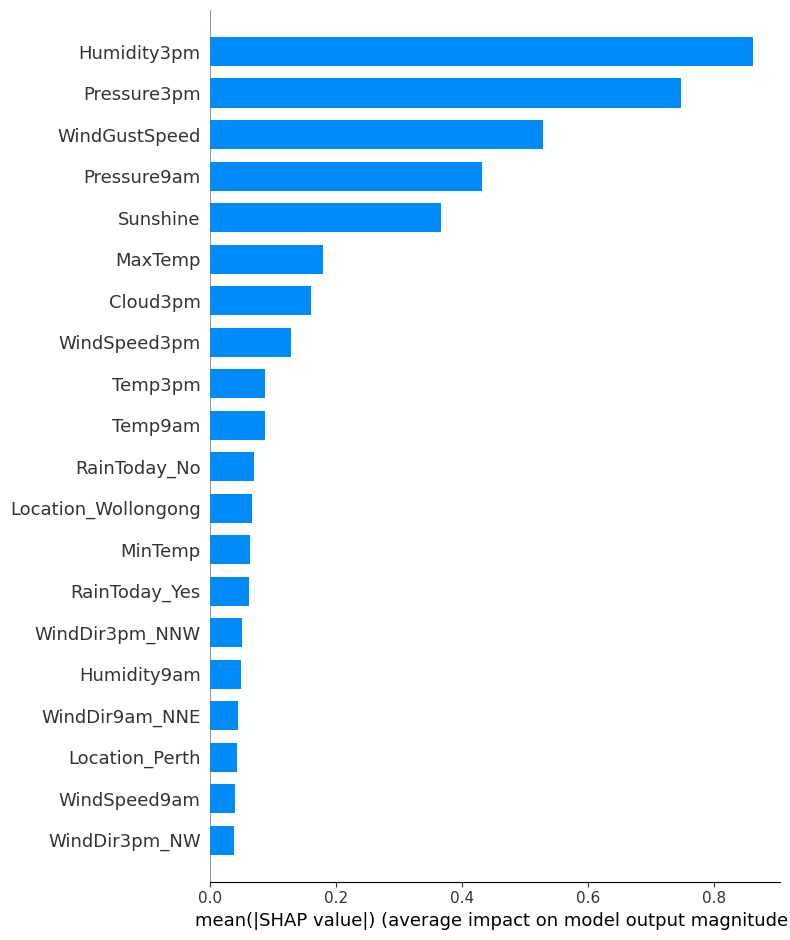

In [84]:
# Plotting a summary plot of SHAP values for each feature in a given sample
shap.summary_plot(log_shap_values, X_train, plot_type="bar")

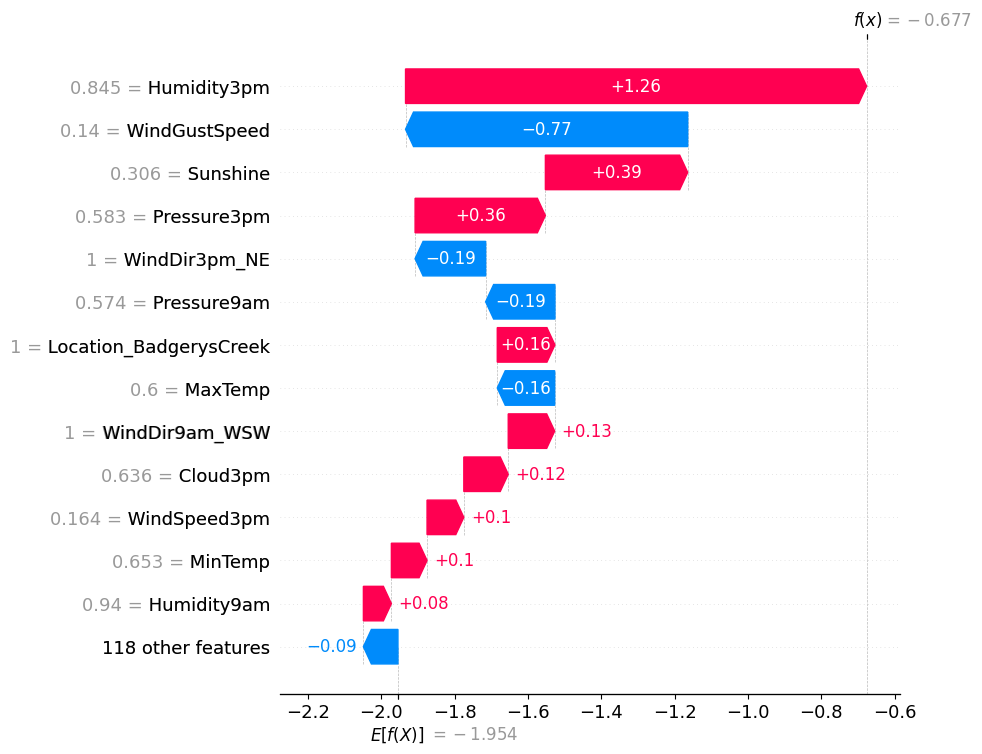

In [85]:
# Plot a Waterfall plot of SHAP values for each feature in a given sample
sample_ind = 18
shap.plots.waterfall(log_shap_values[sample_ind], max_display = 14)

The SHAP Waterfall Plot for Logistic Model is interpreted as follows:

1. Y-axis displays the features of Australian Weather data set used for the prediction whereas X-axis displays the SHAP values indicating the contribution of each feature to the final prediction.
2. The features are sorted based on the magnitude of their contribution with Humidity3PM having the highest contribution of +1.26.
3. The baseline (-1.954) represents the expected prediction based on the average or most common values of all features. The final SHAP value amounts to -0.677.
4. Humidity3PM has the highest positive impact on the prediction whereas WindGustSpeed has the highest negative impact on the prediction.
5. The top features contributing to the prediction are as follows:
  - Humidity3PM
  - WindGustSpeed
  - Sunshine
  - Pressure3PM
  - WindDir3PM_NE


### LightGBM Tree Model SHAP Analysis

100%|===================| 19811/19904 [01:36<00:00]       

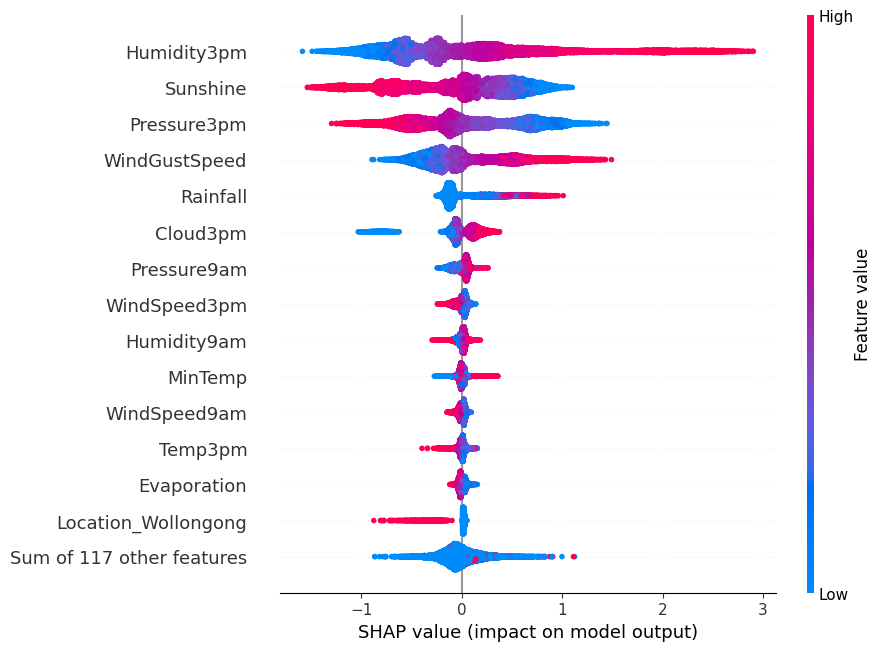

In [86]:
# Using SHAP library to explain the predictions made by logistic regression model
tree_explainer = shap.Explainer(lgb_model, X_train)
tree_shap_values = tree_explainer(X_test_df)
shap.plots.beeswarm(tree_shap_values, max_display=15)

The important features contributing to the prediction in LightGBM Tree Model are as follows:
- Humidity3PM
- Sunshine
- Pressure3PM
- WindGustSpeed
- Rainfall

The plot is interpreted as follows:
1. Unlike the Logistic model's SHAP plot, the Humidity3PM's data is clustered a bit further to the left of the SHAP value. It still follows a directly proportional relationship with the Feature Value.

2. In the Tree Model, Sunshine has a higher feature importance than other features where a low SHAP values leads to a higher feature value. Majority of the values for Sunshine lie below 0 with a medium feature value.

3. Pressure3PM has much fewer outliers in the Tree Model as compared to the Logistic Model. It has a significant amount of points near the zero SHAP value and increasing with increase in feature value.

4. WindGustSpeed's feature importance reduced in the Tree Model and points became highly clustered around the center with reduced outliers.

5. Rainfall was a surprising feature which held very low significance in the Logistic Model having direct relationship between SHAP value and Feature value.

In [87]:
# Using TreeExplainer to compute the SHAP values for the LightGBM model
tree_explainer = shap.TreeExplainer(lgb_model)
tree_shap_values = tree_explainer.shap_values(X_train, approximate = False, check_additivity = False)

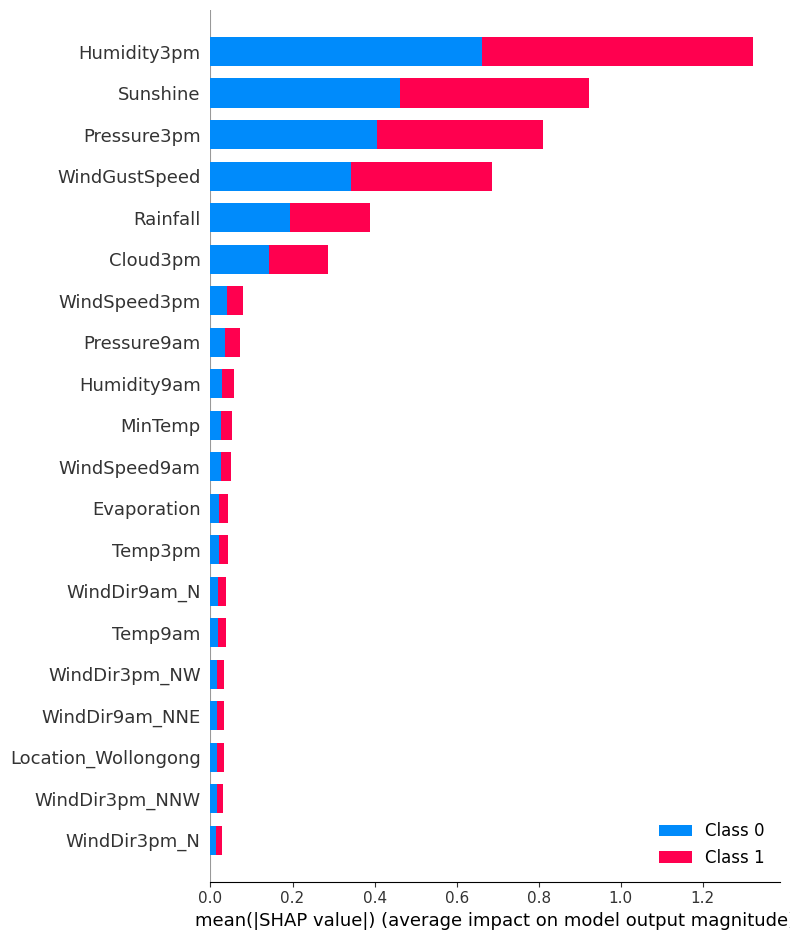

In [88]:
# Plotting the summary plot
shap.summary_plot(tree_shap_values, X_train_plot)

 99%|===================| 19751/19904 [01:36<00:00]       

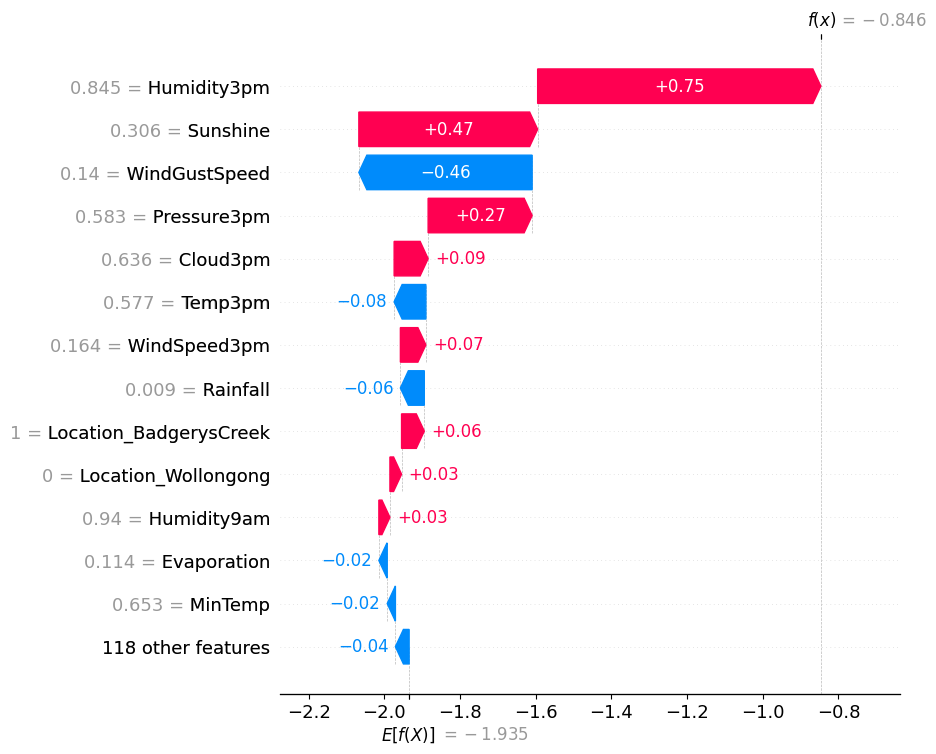

In [89]:
# Plotting the Waterfall plot for Tree model
tree_explainer = shap.Explainer(lgb_model, X_train)
tree_shap_values = tree_explainer(X_test_plot)
sample_ind = 18
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

The SHAP Waterfall Plot for Tree Model is interpreted as follows:

1. The Y-axis display the features used for the prediction represented by vertical bars.
2. The X-axis displays the SHAP values indicating the contribution of each feature to the final prediction. SHAP values can be positive or negative, and the higher their absolute value, the more important the feature is in the prediction.
3. The baseline (-1.935) represents the expected prediction based on the average or most common values of all features. It's usually represented by a horizontal line at the center of the plot.
4. Each vertical bar represents the contribution of a feature to the final prediction. A bar above the baseline has a positive impact on the prediction, while a bar below the baseline has a negative impact.
5. Humidity3PM has the highest positive impact on the prediction whereas WindGustSpeed has the highest negative impact on the prediction.
6. Adding up the total contributions of all the features, we receive the final bar which displays the difference between the baseline prediction and the actual prediction made by the model.

### Partial Dependence Plot (PDP)
A Partial Dependence Plot (PDP) is a graphical method for visualizing the relationship between a specific feature (or variable) and the predicted outcome of a machine learning model. It is a way to understand the effect of a feature on the model's prediction while holding all other features constant.

To create a PDP, we first select a feature of interest and then vary its value across a range of values while keeping all other features fixed. For each value of the feature, we record the predicted outcome of the model, and we plot the average predicted outcome for each value of the feature.

Refer: https://scikit-learn.org/stable/modules/partial_dependence.html

### Logistic Regression Model PDP Analysis

In [90]:
# # Considering 100 samples for SHAP analysis as it is a computationally expensive process
X_train_100 = shap.utils.sample(X_train_plot, 100)
X_test_100 = shap.utils.sample(X_test_plot, 100)

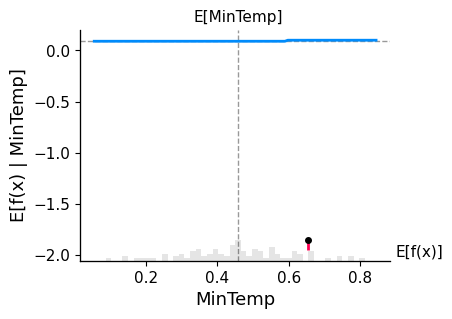

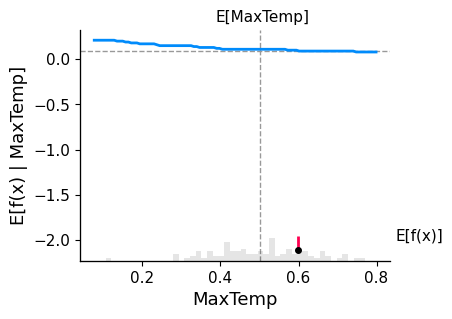

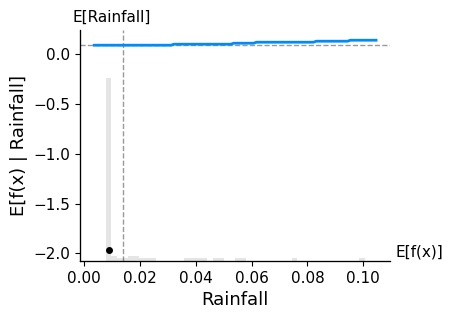

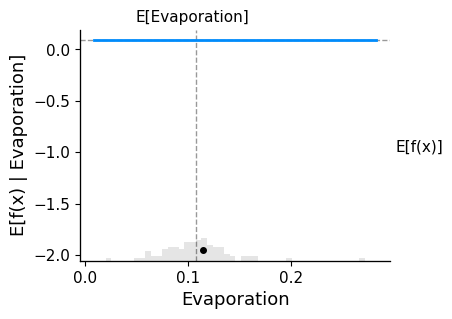

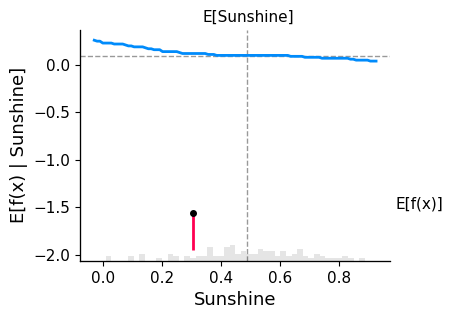

...

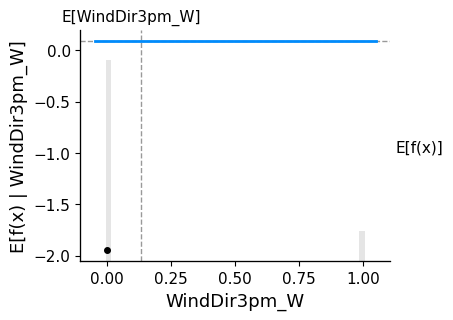

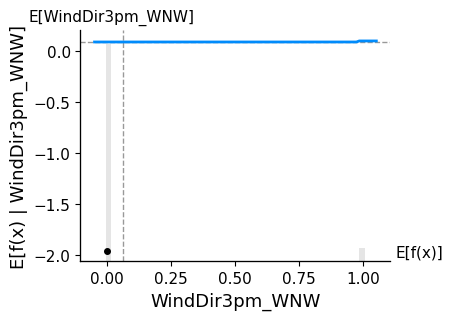

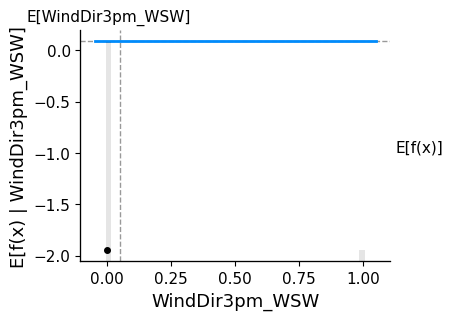

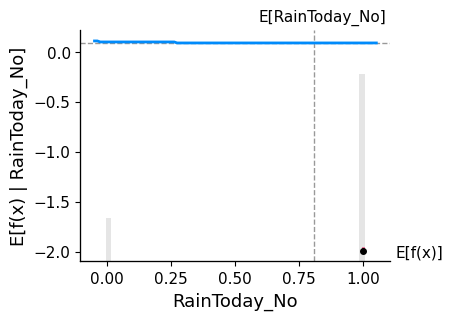

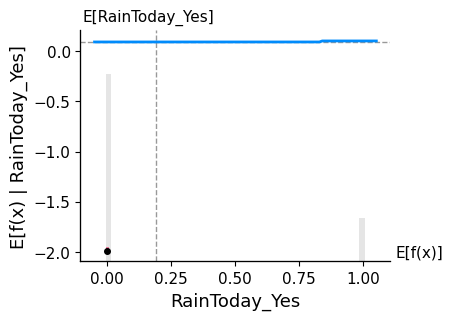

In [91]:
# Generating partial dependence plot using SHAP library for each feature in X_train data
for i in X_train_plot.columns:
    sample_ind = 18
    with plt.rc_context({'figure.figsize': (4, 3)}):
      shap.partial_dependence_plot(i, regressor.predict, X_train_100, model_expected_value=True, feature_expected_value=True, ice=False, shap_values=log_shap_values[sample_ind : sample_ind + 1, :],)
      plt.show()

The Partial Dependence Plot for Logistic Model is interpreted as follows:
1. The X-axis of a partial dependence plot shows the values of the predictor variable being plotted.

2. The Y-axis of a partial dependence plot shows the predicted outcome for each value of the predictor variable.

3. If the curve is a straight line, then the relationship between the predictor variable and the target variable is linear. If the curve is not a straight line, there may be non-linearities or interactions with other variables. As observed from the above plot, MaxTemp has a curved line which indicates multicollinearity among variables.

4. You can determine whether the predictor variable has a positive or negative relationship with the target variable. If the curve is sloping upwards, the relationship is positive, while if the curve is sloping downwards, the relationship is negative. Sunshine has a downward sloping curve which indicates that has a negative relationship with the target variable.

5. The height of the curve can be used to determine the magnitude of the effect of the predictor variable on the predicted outcome. Humidity3PM has a very high upward facing curve which indicates a high magnitude of over 0.5

### LightGBM Tree PDP Plot

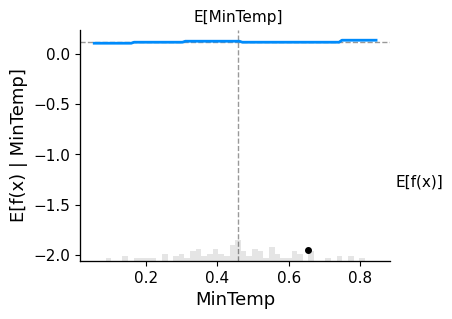

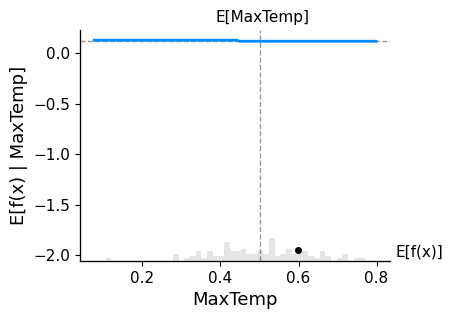

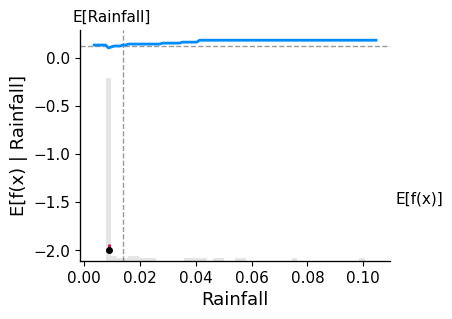

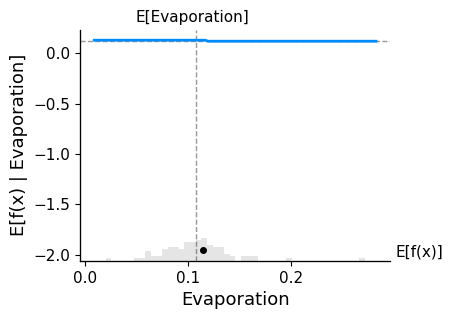

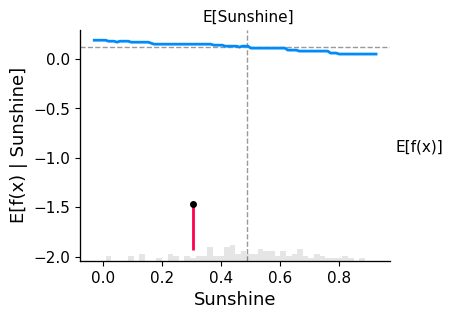

...

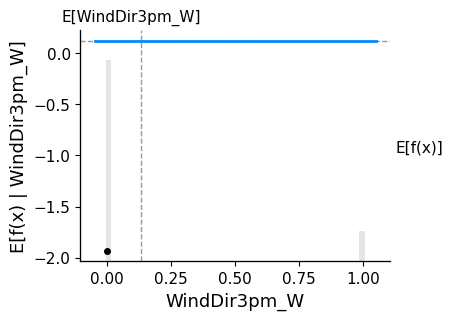

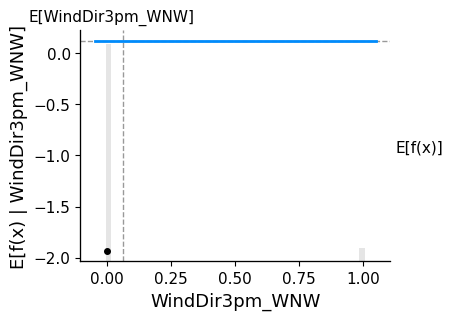

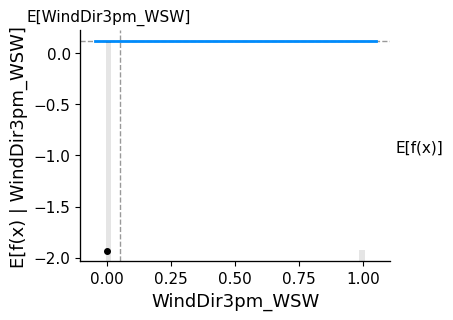

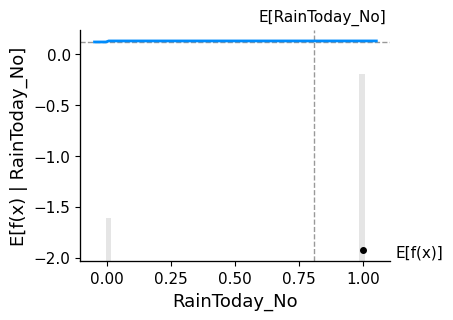

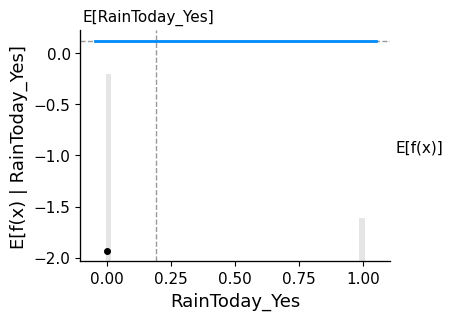

In [92]:
# Computing PDP plots for the tree model
for i in X_train_plot.columns:
    sample_ind = 18
    with plt.rc_context({'figure.figsize': (4, 3)}):
      shap.partial_dependence_plot(i, lgb_model.predict, X_train_100, model_expected_value=True, feature_expected_value=True, ice=False, shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],)

The Partial Dependence Plot for Tree Model is interpreted as follows:
1. The independent variable WindGustSpeed has a curved line which indicates relationship with other variables. 

2. The positive slope of the line indicates a positive relationship with the target variable.

3. The height of the WindGustSpeed line shows a high positive magnitude of effect of the predictor variable on the predicted outcome.

### LIME Plot
LIME (Local Interpretable Model-agnostic Explanations) is a model-agnostic technique for explaining the predictions of any machine learning model. LIME creates local explanations by approximating the model in the neighborhood of a specific prediction, using a simpler, interpretable model.

A LIME plot is a visual representation of the explanation generated by the LIME method. It shows how each feature contributes to the prediction for a specific instance of data.

To create a LIME plot, LIME first selects a specific instance of data and creates a local approximation of the model in the neighborhood of that instance. Then, LIME identifies the features that have the largest effect on the prediction of the approximated model and assigns a weight to each feature based on its contribution to the prediction.

Refer: https://towardsdatascience.com/understanding-model-predictions-with-lime-a582fdff3a3b

### Logistic Regression LIME Analysis

In [93]:
# Initializing LIME explainer for Logistic Model
lime_log_explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=X_train_plot.columns, mode='classification')

Prediction :  [0.]
Actual :      1.0


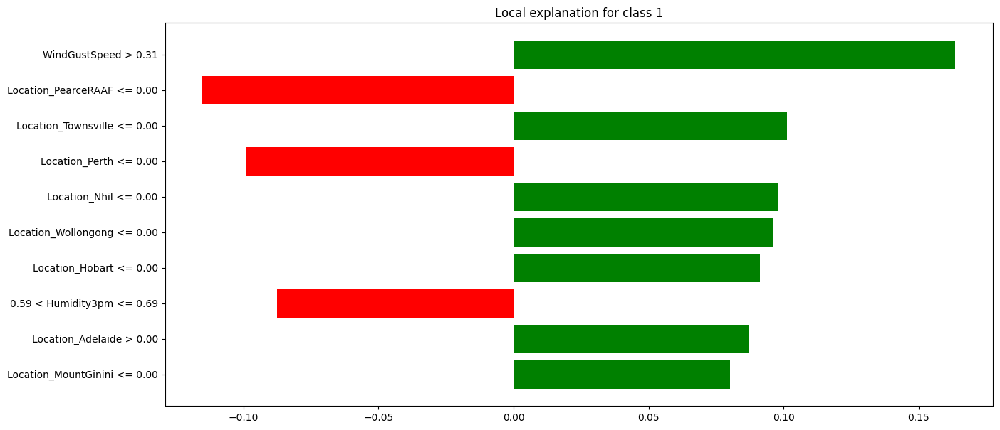

In [94]:
# Getting LIME interpretation for a sample data
idx = 10
lime_log_explanation = lime_log_explainer.explain_instance(X_test_plot.iloc[idx], regressor.predict_proba)

# Printing prediction and actual labels of a single sample
print("Prediction : ", regressor.predict(X_test[0].reshape(1, -1)))
print("Actual :     ", y_test[idx])

# Generating the LIME plot for the sample
with plt.rc_context({'figure.figsize': (15, 7)}):
  fig = lime_log_explanation.as_pyplot_figure()
  plt.show()

In [95]:
# Displaying LIME plot in the Jupyter notebook
lime_log_explanation.show_in_notebook()

The LIME Plot for Logistic Model is interpreted as follows:

1. The vertical bars on the plot show the relative importance of each feature in the prediction. Features with higher bars are more important in the prediction than features with lower bars. In the sample prediction considered above, WindGustSpeed has the highest importance out of all the variables.

2. The color of each bar indicates whether the feature has a positive (blue) or negative (red) impact on the prediction. Blue bars indicate that an increase in the feature value leads to a higher prediction, while orange bars indicate that an increase in the feature value leads to a lower prediction.

3. Here, the overall probability for predicting 0 was 0.36 and probability for predicting 1 was 0.64

4. The width of the bars on the plot indicates the degree of uncertainty in the LIME explanation. Narrow bars indicate high confidence in the explanation, while wide bars indicate lower confidence. All the features to the left contribute to the probability of 0 and features to the right contribute to the probability of 1.

### Tree Model LIME Analysis

In [96]:
# Initializing LIME explainer for Tree Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=X_train_plot.columns, mode='classification')

Prediction :  [0.]
Actual :  1.0


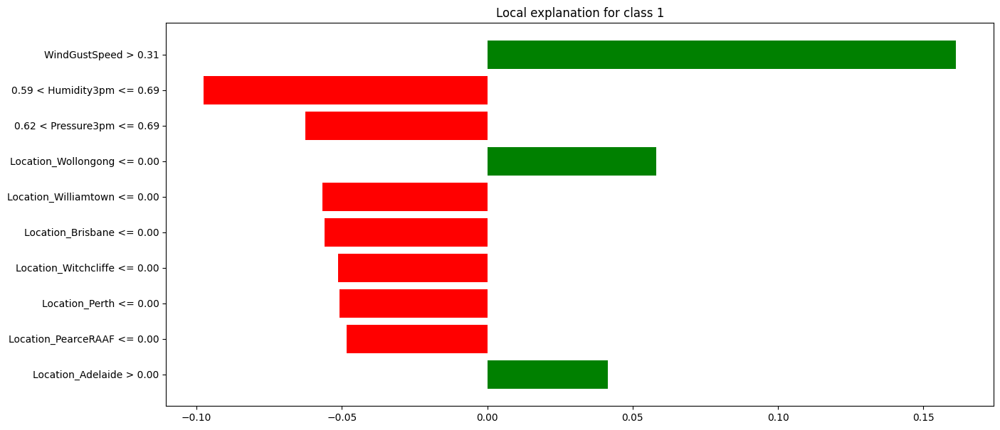

In [97]:
# Getting LIME interpretation for a sample data
idx = 10
lime_tree_explanation = lime_tree_explainer.explain_instance(X_test_plot.iloc[idx], lgb_model.predict_proba)

print("Prediction : ", lgb_model.predict(X_test[0].reshape(1, -1)))
print("Actual : ", y_test[idx])

# Generating the LIME plot for the sample
with plt.rc_context({'figure.figsize': (15, 7)}):
  fig = lime_tree_explanation.as_pyplot_figure()
  plt.show()

In [98]:
# Displaying LIME plot in the Jupyter notebook
lime_tree_explanation.show_in_notebook()

The LIME Plot for Tree Model is interpreted as follows:

1. The above plot describes the features which contributed to the final contribution in the tree model.

2. WindGustSpeed had the highest positive impact on the prediction while Humidity3PM had the highest negative impact on the prediction.

3. The top features being considered for prediction are as follows:
  - WindGustSpeed
  - Humidity3pm
  - Location_Perth
  - Location_Wollongong
  - Pressure3pm

4. The features WindGustSpeed, Location_Wollongong, Location_Adelaide, Rainfall, Location_Hobart and Location_MelbourneAirport contribute to generate the probability of predicting 1 of 0.58.

5. The features Humidity3pm, Location_Perth, Pressure3pm and Location_Witchcliffe contribute to generate the probability of predicting 0 of 0.42.

## Comparing Model Interpretability Methods

### 1. SHAP Analysis
- SHAP values can be used to identify the direction and strength of the effect of each feature on the prediction.
- SHAP values are model-agnostic and can be used with any machine learning model.
- However, computing SHAP values can be computationally expensive, especially for complex models with many features.
- SHAP values for Tree Model differed a bit from the Logistic and AutoML Model as the importance for independent variable Sunshine was a bit lower.

### 2. Partial Dependence Plot
- PDP plots can reveal non-linear relationships between the features and the predicted outcome.
- PDP plots can help identify interactions between features.
- They are relatively easy to compute and can be visualized for multiple features.
- However, they can be difficult to interpret for complex models with many features.
- The non-linear relationships which were not visible in SHAP analysis for variables such as Sunshine and WindGustSpeed are more apparent in PDP plot.

### 3. LIME Plot
- LIME can be used with any machine learning model and does not require access to the model's parameters.
- LIME plots can be visualized and interpreted easily.
- LIME explanations may not be representative of the overall behavior of the model.
- LIME explanations may be sensitive to the choice of the reference distribution used for sampling.
- This can be interpreted by changing the sample prediction which we used for generating the LIME Plot. For each different prediction, the LIME plot generated will be different along with different prediction probabilities.


## Conclusion
In summary, this study highlights the significance of interpretability in machine learning models for weather prediction. We used several interpretability techniques, including PDP, LIME, and SHAP plots, to compare various models. Our analysis revealed that the logistic model provided straightforward insights, the tree-based model had a complex decision-making process, and the Auto-ML model had limited interpretability. Our study underscores the importance of interpretable models to gain insights and improve model performance.

## References
We have referred the following links and websites to understand the machine learning concepts:

1. GeeksforGeeks
2. towardsdatascience
3. scikitlearn documentation
4. StatQuest with Josh Starmer
5. SHAP documentation
6. H2O AutoML documentation

Specific links have been provided within the notebook for detailed reference. We referred matplotlib and seaborn documentation for preparing data visualizations. Rest of the code is written individually with reference to the previous assignments.

MIT License

Copyright (c) 2022 Draconian10

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.